# Исследование объявлений о продаже квартир

В вашем распоряжении данные сервиса Яндекс.Недвижимость — архив объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктов за несколько лет. Нужно научиться определять рыночную стоимость объектов недвижимости. Ваша задача — установить параметры. Это позволит построить автоматизированную систему: она отследит аномалии и мошенническую деятельность. 

По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма.
По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма.

### Откройте файл с данными и изучите общую информацию. 

Импортируем основные библиотеки, которые будут использоваться при анализе датасета.

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline
sns.set()

Загружим данные из файла в датасет и смотрим на них.

In [2]:
data = pd.read_csv('/datasets/real_estate_data.csv', sep='\t')
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,...,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,...,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.0,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,...,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.0,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.0,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,...,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


In [3]:
data.tail()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
23694,9,9700000.0,133.81,2017-03-21T00:00:00,3,3.7,5.0,73.3,3,NaN,...,13.83,NaN,Санкт-Петербург,24665.0,4232.0,1.0,796.0,3.0,381.0,NaN
23695,14,3100000.0,59.00,2018-01-15T00:00:00,3,NaN,5.0,38.0,4,NaN,...,8.50,NaN,Тосно,NaN,NaN,NaN,NaN,NaN,NaN,45.0
23696,18,2500000.0,56.70,2018-02-11T00:00:00,2,NaN,3.0,29.7,1,NaN,...,NaN,NaN,село Рождествено,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23697,13,11475000.0,76.75,2017-03-28T00:00:00,2,3.0,17.0,NaN,12,NaN,...,23.30,2.0,Санкт-Петербург,39140.0,10364.0,2.0,173.0,3.0,196.0,602.0
23698,4,1350000.0,32.30,2017-07-21T00:00:00,1,2.5,5.0,12.3,1,NaN,...,9.00,NaN,поселок Новый Учхоз,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
data.shape

(23699, 22)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

In [6]:
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23699.000000,2.369900e+04,23699.000000,23699.000000,14504.000000,23613.000000,21796.000000,23699.000000,21421.000000,12180.000000,18157.000000,18180.000000,18181.000000,8079.000000,18181.000000,9110.000000,20518.000000
mean,9.858475,6.541549e+06,60.348651,2.070636,2.771499,10.673824,34.457852,5.892358,10.569807,1.150082,28793.672193,14191.277833,0.611408,490.804555,0.770255,517.980900,180.888634
std,5.682529,1.088701e+07,35.654083,1.078405,1.261056,6.597173,22.030445,4.885249,5.905438,1.071300,12630.880622,8608.386210,0.802074,342.317995,0.938346,277.720643,219.727988
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.300000,0.000000,0.000000,181.000000,0.000000,1.000000,0.000000,13.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.520000,5.000000,18.600000,2.000000,7.000000,0.000000,18585.000000,9238.000000,0.000000,288.000000,0.000000,294.000000,45.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.650000,9.000000,30.000000,4.000000,9.100000,1.000000,26726.000000,13098.500000,0.000000,455.000000,1.000000,502.000000,95.000000
75%,14.000000,6.800000e+06,69.900000,3.000000,2.800000,16.000000,42.300000,8.000000,12.000000,2.000000,37273.000000,16293.000000,1.000000,612.000000,1.000000,729.000000,232.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


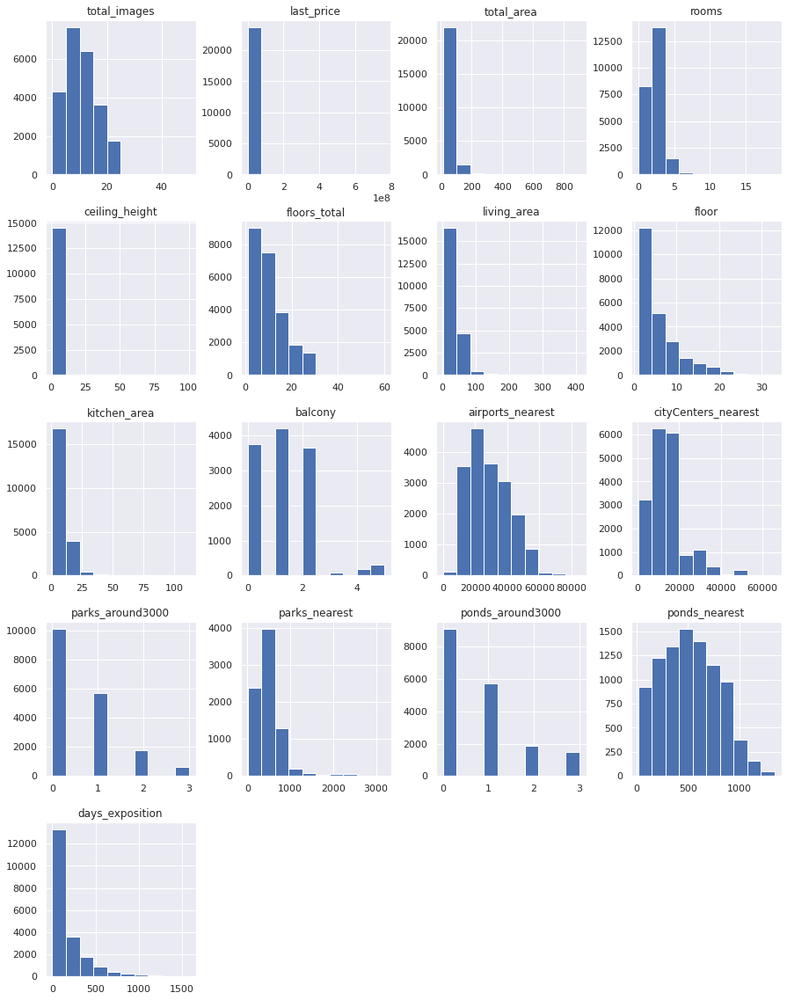

In [7]:
data.hist(figsize=(15, 20));

Попробуем посмотреть под другим углом

In [8]:
!pip install dataprep
from dataprep.eda import plot, plot_correlation, create_report, plot_missing

  0%|          | 0/1265 [00:00<?, ?it/s]


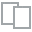
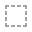
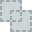
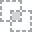
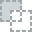
...
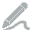
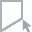
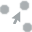
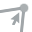
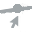

In [9]:
plot(data)

В нашем датасете 23 699 строк с 21 фичей:
- по предварительной оценке нет дубликатов;
- 8 категориальных и 14 числовых признаков;
- в 15 колонках есть пропущенные данные, примечательно, что отсутствует часть картографической информации.
Теперь пройдемся по всех признакам подробнее:
- `total_images` — **число фотографий квартиры в объявлении** - диапозон от 0 до 50 фотографий, 
в среднем 9. Итересный "всплеск на 20";
- `last_price` - **цена на момент снятия с публикации** - в среднем цена 6,5кк, но исходя из медианы половина дешевле 4,65кк и еще нам среднее портит выброс куда-то в район 747кк, тип данных лучше заменить на `int` (копейки не играют роли);
- `total_area` - **общая площадь квартиры в квадратных метрах (м²)** - средняя площая 60 м², медиана 52 м², и очевидный выброс с 900 м², так как третий квартиль 96,9 м².
- `first_day_exposition` — **дата публикации** - в наличии 1491 день, если нам потребуется в исследовании дата, нужно будет перевести в datetime;
- `rooms` — **число комнат** - в среднем продавали двушки, максимально 19 комнат, а вот минимально в 197 случаях почему-то 0 (следует обратить внимание);
- `ceiling_height` — **высота потолков (м)** - есть пропущенные данные, есть выбросы со значениями 1 и 100, но в целом высота потолка у всех близка к стандарту. 
- `floors_total` — **всего этажей в доме** - целесообразно перевести в `int`, так как число этажей не может быть дробным. Также есть пропуски. Больше половины домов равно или выше 9 этажей и почти четверть 5-этажки;
- `living_area` — **жилая площадь в квадратных метрах (м²)** - есть пропуск, есть выбросы (2 м²);
- `floor` — **этаж** - данные полные, все выглядит корректно;
- `is_apartment` — **апартаменты (булев тип)** - следует изменить тип данных на `bool`, много пропусков;
- `studio` — **квартира-студия (булев тип)** - данные полные, все выглядит корректно;
- `open_plan` — **свободная планировка (булев тип)** - данные полные, все выглядит корректно;
- `kitchen_area` — **площадь кухни в квадратных метрах (м²)** - есть пропуски и судя по макс и мин есть выбросы;
- `balcony` — **число балконов** - заменить тип данных на `int`, есть пропуски;
- `locality_name` — **название населённого пункта** - есть пропуски, 66.34 % квартир в Санкт-Петербурге, всего 364 локации;
- `airports_nearest` — расстояние до ближайшего аэропорта в метрах (м) - пропущено 5542 (23.38%) значения;
- `cityCenters_nearest` — **расстояние до центра города (м)** - есть пропуски, судя по данным в 50 км от Питера есть поселок, или город спутник;
- `parks_around3000` — **число парков в радиусе 3 км** - есть пропуски, тип данных заменить на `int`;
- `parks_nearest` — **расстояние до ближайшего парка (м)** - есть пропуски, тип данных лучше заменить на `int` (см не играют роли), также лучше убрать выбросы выше 3000 м;
- `ponds_around3000` — **число водоёмов в радиусе 3 км** - есть пропуски, тип данных заменить на `int`;
- `ponds_nearest` — **расстояние до ближайшего водоёма (м)** - есть пропуски, тип данных лучше заменить на `int` (см не играют роли);
- `days_exposition` — **сколько дней было размещено объявление (от публикации до снятия)** - есть пропуски, тип данных заменить на `int`.

### Предобработка данных

Теперь внимательно смотрим на все фичи по очереди, выявляю пропущенные значения, выбросы с целью замены или удаления.

`plot_missing(data)` - так как эта библиотека очень затратна по памяти и месту на диске, пришлось наделать скринов, иначе работа не сохраняется.

<img typeof="foaf:Image" src="https://i.postimg.cc/zvyXsw7r/image.jpg" alt="">

Число фотографий нас мало интересует, но все же взглянем подробнее.

`create_report(data['total_images'])`

<img typeof="foaf:Image" src="https://i.postimg.cc/DwNVDVD8/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/MKj1R1SN/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/VNHjngJy/image.jpg" alt="">

Как и ожидалось ничего необычного мы не увидили.Несколько выбросов выше 26, но для нас это некритично.

Рассмотрим столбец с ценой.

`create_report(data['last_price'])`

<img typeof="foaf:Image" src="https://i.postimg.cc/6pMHbd8c/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/hPPTyNVF/image.jpg" alt="">

На графике не очень понятно, с какого момента начинаются выбросы, посмотрим поближе

<AxesSubplot:xlabel='last_price'>

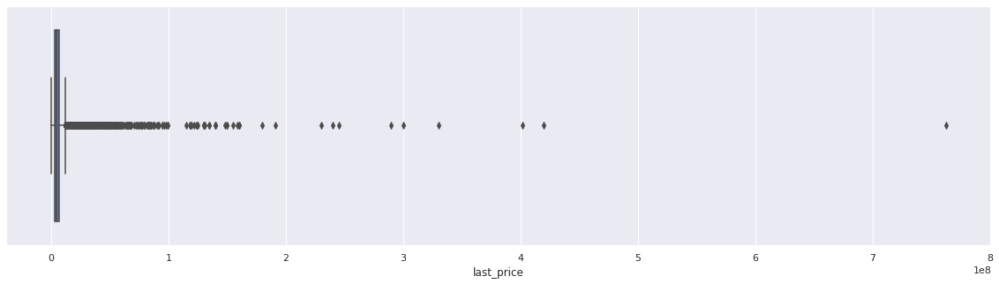

In [10]:
plt.figure(figsize=(20,5))
sns.boxplot(x = data['last_price'])

Понятнее не стало, попробуем обрезать хвост

In [11]:
(data['last_price']>83000000).sum()

54

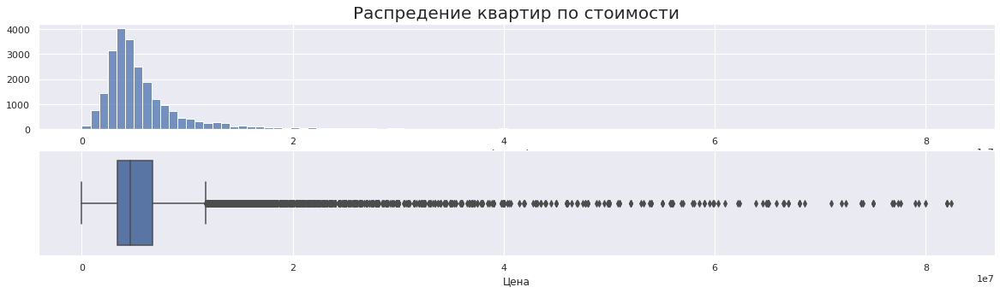

In [12]:
def hist_boxplot(data, bins, title, xtitle, ytitile):
    plt.figure(figsize=(20,5))
    plt.subplot(2,1,1)
    sns.histplot(data, bins=bins)
    plt.title(title, fontsize=20)
    plt.ylabel(ytitile);
    plt.subplot(2,1,2)
    sns.boxplot(x = data)
    plt.xlabel(xtitle)
    
hist_boxplot(data[data['last_price']<83000000]['last_price'], 100, 'Распредение квартир по стоимости', 'Цена', '')

Картина стала понятнее, уберем из датасета 54 строки со значениями выше 83кк, и заменим тип данных на `int`

In [13]:
data['last_price'] = data['last_price'].astype('int')

In [14]:
data = data[data['last_price']<83000000].reset_index(drop=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23644 entries, 0 to 23643
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23644 non-null  int64  
 1   last_price            23644 non-null  int64  
 2   total_area            23644 non-null  float64
 3   first_day_exposition  23644 non-null  object 
 4   rooms                 23644 non-null  int64  
 5   ceiling_height        14467 non-null  float64
 6   floors_total          23558 non-null  float64
 7   living_area           21748 non-null  float64
 8   floor                 23644 non-null  int64  
 9   is_apartment          2769 non-null   object 
 10  studio                23644 non-null  bool   
 11  open_plan             23644 non-null  bool   
 12  kitchen_area          21375 non-null  float64
 13  balcony               12153 non-null  float64
 14  locality_name         23595 non-null  object 
 15  airports_nearest   

Мы исключили сверх дорогие квартиры, хотелось бы посмотреть, а что у нас с самыми дешевыми квартирами

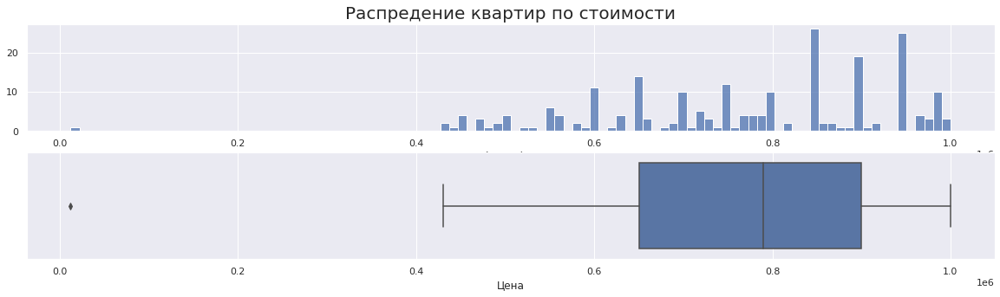

In [15]:
hist_boxplot(data[data['last_price']<1000000]['last_price'], 100, 'Распредение квартир по стоимости', 'Цена', '')

у нас есть аномально низкое значение

In [16]:
data[data['last_price']<400000]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
8771,7,12190,109.0,2019-03-20T00:00:00,2,2.75,25.0,32.0,25,NaN,...,40.5,NaN,Санкт-Петербург,36421.0,9176.0,1.0,805.0,0.0,NaN,8.0


Скорее всего здесь мы видим опечатку, и цена указана в тыс. рублей. Посмотрим цены на аналогичные по площади квартиры

In [17]:
data[data['total_area'].between(105, 115)].describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,421.000000,4.210000e+02,421.000000,421.000000,278.000000,418.000000,378.000000,421.000000,382.000000,194.000000,398.000000,400.000000,400.000000,226.000000,400.000000,236.000000,340.000000
mean,10.954869,1.397609e+07,109.643729,3.382423,2.986906,10.354067,64.003730,5.859857,17.249476,1.252577,26743.535176,9185.657500,0.860000,535.827434,0.995000,515.190678,281.494118
std,6.265199,7.096511e+06,3.022140,0.794969,0.338823,6.702947,12.194625,4.904986,8.399381,1.382016,9516.409733,7104.846085,0.928739,418.069416,1.033269,275.382862,274.350727
min,0.000000,1.219000e+04,105.000000,1.000000,2.500000,1.000000,30.000000,1.000000,6.000000,0.000000,9968.000000,287.000000,0.000000,19.000000,0.000000,16.000000,3.000000
25%,6.000000,1.000000e+07,107.000000,3.000000,2.750000,5.000000,56.000000,2.000000,12.000000,0.000000,21219.000000,4499.250000,0.000000,289.500000,0.000000,297.000000,89.750000
50%,11.000000,1.250000e+07,109.300000,3.000000,3.000000,7.000000,65.150000,4.000000,15.000000,1.000000,24521.500000,6211.000000,1.000000,473.500000,1.000000,485.000000,190.000000
75%,16.000000,1.572841e+07,112.000000,4.000000,3.150000,15.000000,72.100000,7.000000,20.000000,2.000000,32730.750000,12774.250000,1.000000,636.500000,2.000000,755.000000,388.500000
max,32.000000,8.200000e+07,115.000000,6.000000,4.500000,27.000000,93.600000,25.000000,60.000000,5.000000,68909.000000,50635.000000,3.000000,2665.000000,3.000000,1018.000000,1225.000000


Наша гипотеза подтвердилась. Средняя цена 10.7кк и медиана 10,9кк. Цена в 12.9кк выше рынка, но судя по площади кухни в 40.5 м², это какое-то элитное жилье, на что указывает и общая площадь, и то, что объявление было снято через 8 дней после опубликования (хотя не исключено, что объявление было снято из-за нахождения неверных сведений).

In [18]:
data[(data['floor']==25) & (data['rooms']==2)& (data['kitchen_area']==40.5)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
8771,7,12190,109.0,2019-03-20T00:00:00,2,2.75,25.0,32.0,25,NaN,...,40.5,NaN,Санкт-Петербург,36421.0,9176.0,1.0,805.0,0.0,NaN,8.0


Мы проверили еще одну гипотезу. Квартира все-таки была продана, так как в нашем датасете больше нет похожих квартир

In [19]:
data.iloc[8770:8773]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
8770,1,7000000,80.0,2019-01-24T00:00:00,3,NaN,25.0,49.0,6,NaN,...,13.0,NaN,Санкт-Петербург,37006.0,15157.0,0.0,NaN,0.0,NaN,29.0
8771,7,12190,109.0,2019-03-20T00:00:00,2,2.75,25.0,32.0,25,NaN,...,40.5,NaN,Санкт-Петербург,36421.0,9176.0,1.0,805.0,0.0,NaN,8.0
8772,20,11000000,65.6,2017-10-26T00:00:00,2,NaN,10.0,37.4,9,NaN,...,11.2,2.0,Санкт-Петербург,23604.0,5294.0,0.0,NaN,1.0,434.0,269.0


In [20]:
data.loc[8771, 'last_price'] *= 1000
data.iloc[8770:8773]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
8770,1,7000000,80.0,2019-01-24T00:00:00,3,NaN,25.0,49.0,6,NaN,...,13.0,NaN,Санкт-Петербург,37006.0,15157.0,0.0,NaN,0.0,NaN,29.0
8771,7,12190000,109.0,2019-03-20T00:00:00,2,2.75,25.0,32.0,25,NaN,...,40.5,NaN,Санкт-Петербург,36421.0,9176.0,1.0,805.0,0.0,NaN,8.0
8772,20,11000000,65.6,2017-10-26T00:00:00,2,NaN,10.0,37.4,9,NaN,...,11.2,2.0,Санкт-Петербург,23604.0,5294.0,0.0,NaN,1.0,434.0,269.0


Мы поправили значение в заданной строке, еще раз посмотрим на графики.

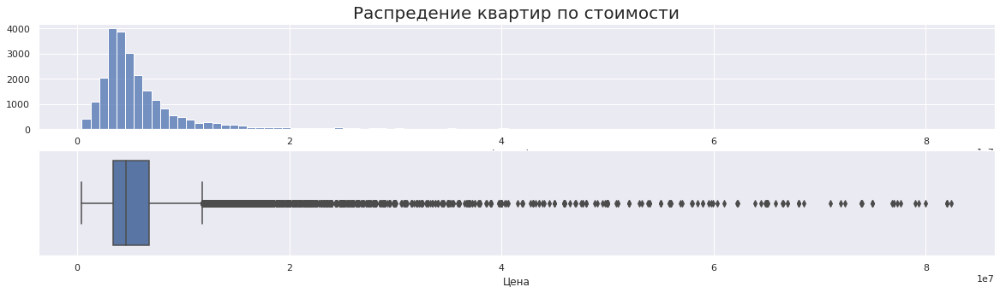

In [21]:
hist_boxplot(data['last_price'], 100, 'Распредение квартир по стоимости', 'Цена', '')

смотрим общую площадь квартир

`create_report(data['total_area'])`

<img typeof="foaf:Image" src="https://i.postimg.cc/SRG5yHKF/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/mkq9FgkQ/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/KYzgQTTn/image.jpg" alt="">

95 процентиль = 114.8 м². Посмотри сколько квартир выше этого значения. 

In [22]:
(data['total_area']>=114.8).sum()

1185

Получилось неожиданно много. Посмотрим, что из себя представляет гистограмма и диаграмма размаха на всех данных, и без исключенных.

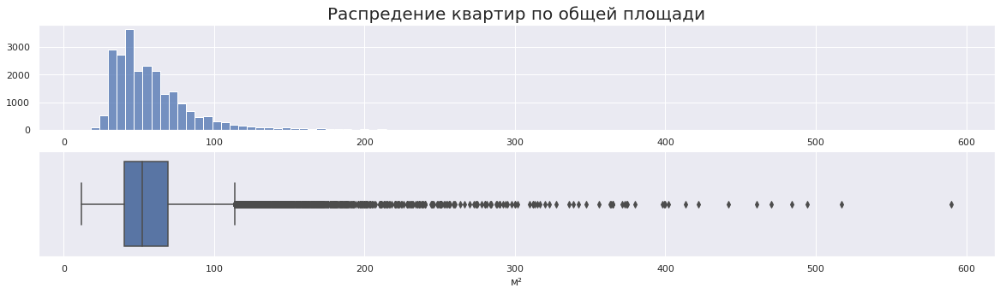

In [23]:
hist_boxplot(data['total_area'], 100, 'Распредение квартир по общей площади', 'м²', '')

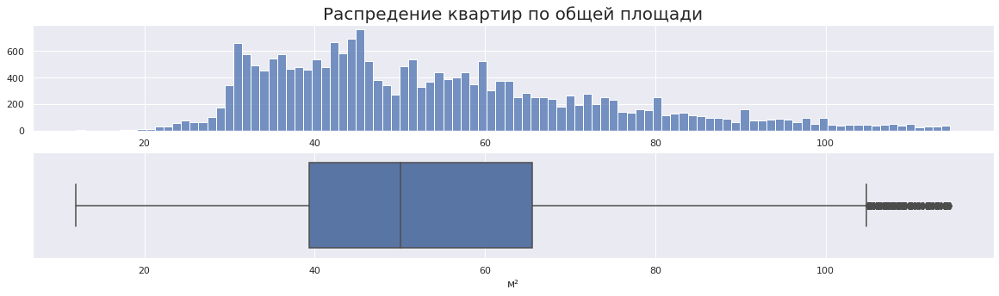

In [24]:
hist_boxplot(data[data['total_area']<114.8]['total_area'], 100, 'Распредение квартир по общей площади', 'м²', '')

Второй набор графиков симпатичнее, но исключать 5% как-то рука не поднимается. Оставим как есть, хотя очень хочется отсечь хотя бы всё, что больше 410.

Перейдем к дате публикации. для начала переведем данные в тип `datetime`.

In [25]:
data['first_day_exposition'] = pd.to_datetime(data['first_day_exposition'], format = '%Y-%m-%d')
data['first_day_exposition'].head()

0   2019-03-07
1   2018-12-04
2   2015-08-20
3   2015-07-24
4   2018-06-19
Name: first_day_exposition, dtype: datetime64[ns]

<AxesSubplot:>

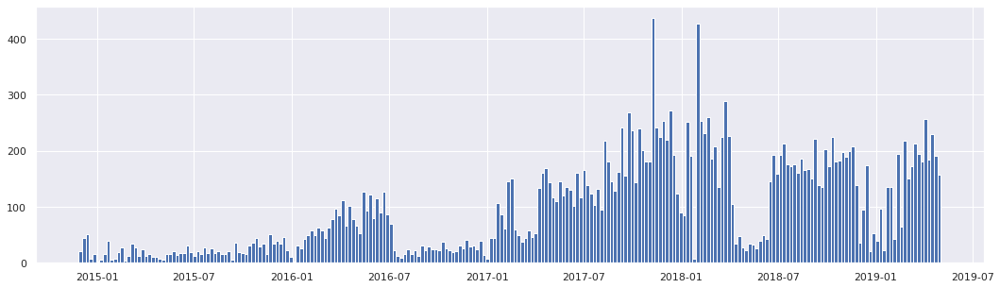

In [26]:
data['first_day_exposition'].hist(bins=250, figsize=(18, 5))

В целом мы видим некоторые проседания в продажах во второй половине 2016 г., II квартал 2018 и зима 2019, но без привязки к новостной повестке мы не сможем объяснить эти спады. В остальном данные выглядят правдоподобно.

Исследуем количество комнат в квартирах.

In [27]:
data['rooms'].value_counts()

1     8047
2     7939
3     5804
4     1168
5      310
0      197
6       99
7       53
8       10
9        7
10       3
11       2
14       2
16       1
19       1
15       1
Name: rooms, dtype: int64

`create_report(data['rooms'])`

<img typeof="foaf:Image" src="https://i.postimg.cc/508vFVvG/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/cC9Jv9D2/image.jpg" alt="">

Первый вопрос, откуда у нас нули (197 шт.)?

In [28]:
data[data['rooms'] == 0].head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
144,1,2450000,27.00,2017-03-30,0,NaN,24.0,15.50,2,NaN,...,NaN,2.0,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,181.0
348,4,2320000,25.00,2017-09-27,0,NaN,14.0,17.00,1,NaN,...,NaN,0.0,деревня Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,45.0
439,8,2480000,27.11,2018-03-12,0,NaN,17.0,24.75,4,NaN,...,NaN,2.0,Санкт-Петербург,38171.0,15015.0,0.0,NaN,2.0,982.0,64.0
506,0,3375000,34.40,2017-03-28,0,NaN,26.0,24.30,19,NaN,...,NaN,1.0,посёлок Парголово,53115.0,19292.0,0.0,NaN,1.0,593.0,430.0
605,2,1850000,25.00,2019-02-20,0,NaN,10.0,NaN,7,NaN,...,NaN,NaN,посёлок Шушары,NaN,NaN,NaN,NaN,NaN,NaN,29.0
694,12,2500000,24.10,2017-12-01,0,2.75,25.0,17.50,21,NaN,...,NaN,NaN,деревня Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,201.0
713,5,1500000,17.00,2017-06-07,0,2.70,9.0,12.00,1,NaN,...,NaN,0.0,посёлок Шушары,18654.0,29846.0,0.0,NaN,0.0,NaN,40.0
777,9,2600000,26.10,2018-02-20,0,NaN,18.0,NaN,8,NaN,...,NaN,1.0,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,45.0
835,14,1900000,35.00,2017-04-14,0,2.70,5.0,15.00,3,False,...,NaN,1.0,поселок Новый Свет,NaN,NaN,NaN,NaN,NaN,NaN,7.0
942,5,2200000,23.00,2016-09-27,0,NaN,27.0,18.00,7,NaN,...,NaN,2.0,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,483.0


<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Грамотный шаг

In [29]:
data[data['rooms'] == 0].tail(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
22467,5,2350000,23.39,2018-08-28,0,NaN,17.0,13.54,13,NaN,...,NaN,NaN,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,49.0
22519,8,2250000,24.00,2017-09-28,0,NaN,12.0,15.00,3,NaN,...,NaN,2.0,городской посёлок Новоселье,NaN,NaN,NaN,NaN,NaN,NaN,45.0
22777,5,2600000,28.00,2018-12-14,0,2.6,16.0,16.80,9,NaN,...,NaN,NaN,Санкт-Петербург,19372.0,22796.0,0.0,NaN,1.0,406.0,NaN
22812,8,3090000,30.00,2017-12-17,0,NaN,25.0,18.20,5,NaN,...,NaN,NaN,Санкт-Петербург,35250.0,16414.0,0.0,NaN,1.0,400.0,211.0
22822,2,4280000,28.00,2017-10-26,0,2.7,19.0,18.00,10,NaN,...,NaN,NaN,Санкт-Петербург,18982.0,7206.0,0.0,NaN,1.0,415.0,151.0
23155,7,3200000,26.00,2017-09-01,0,NaN,25.0,18.00,16,NaN,...,NaN,0.0,Санкт-Петербург,11405.0,13222.0,0.0,NaN,1.0,623.0,14.0
23387,0,2500000,27.70,2017-09-28,0,NaN,24.0,18.00,4,NaN,...,NaN,2.0,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,4.0
23499,15,3350000,26.00,2018-09-07,0,NaN,19.0,NaN,8,NaN,...,NaN,NaN,Санкт-Петербург,18090.0,17092.0,0.0,NaN,2.0,112.0,31.0
23537,10,1450000,29.00,2017-11-11,0,NaN,9.0,18.00,8,NaN,...,NaN,2.0,Никольское,NaN,NaN,NaN,NaN,NaN,NaN,82.0
23582,8,2350000,26.00,2018-06-26,0,NaN,25.0,17.00,4,NaN,...,NaN,2.0,посёлок Бугры,NaN,NaN,NaN,NaN,NaN,NaN,207.0


In [30]:
data[data['rooms'] == 0].describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,197.000000,1.970000e+02,197.000000,197.0,82.000000,194.000000,183.000000,197.000000,0.0,126.000000,118.000000,118.000000,118.000000,29.000000,118.000000,69.000000,183.000000
mean,7.776650,3.337724e+06,29.279746,0.0,3.104268,16.896907,18.865246,8.578680,NaN,1.579365,24516.432203,13388.610169,0.296610,594.862069,0.822034,526.043478,109.180328
std,5.079055,5.046022e+06,25.855264,0.0,2.698948,6.925936,6.549527,6.290595,NaN,0.661552,12386.969865,5028.479861,0.559446,302.820164,0.873458,274.811509,158.847377
min,0.000000,9.457500e+05,15.500000,0.0,2.500000,3.000000,2.000000,1.000000,NaN,0.000000,6989.000000,1261.000000,0.000000,38.000000,0.000000,72.000000,3.000000
25%,4.000000,2.300000e+06,24.050000,0.0,2.700000,12.000000,16.000000,3.000000,NaN,1.000000,14567.000000,11618.000000,0.000000,396.000000,0.000000,348.000000,27.500000
50%,7.000000,2.700000e+06,26.050000,0.0,2.750000,17.000000,18.000000,7.000000,NaN,2.000000,21460.000000,13595.500000,0.000000,535.000000,1.000000,528.000000,50.000000
75%,11.000000,3.380000e+06,28.400000,0.0,2.800000,23.000000,19.950000,13.000000,NaN,2.000000,34004.750000,16383.750000,0.000000,761.000000,1.000000,674.000000,117.500000
max,21.000000,7.100000e+07,371.000000,0.0,27.000000,35.000000,68.000000,26.000000,NaN,2.000000,55551.000000,29846.000000,2.000000,1199.000000,3.000000,1159.000000,931.000000


In [31]:
data[data['rooms'] == 0]['studio'].value_counts()

True     138
False     59
Name: studio, dtype: int64

Судя по среднему и медианному значению, это в большинстве своем студии или 1-комнатные квартиры.

Заменим на 1 значения в строках при условии, что это студии:

In [32]:
data.loc[(data['rooms'] == 0)&(data['studio'] == True), 'rooms'] = 1
data[data['rooms'] == 0].describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,59.000000,5.900000e+01,59.000000,59.0,10.00000,59.000000,55.000000,59.000000,0.0,46.000000,31.000000,31.000000,31.000000,9.000000,31.000000,21.000000,59.000000
mean,7.423729,3.911034e+06,32.707288,0.0,5.26200,17.559322,18.585455,9.610169,NaN,1.586957,25054.354839,13577.870968,0.387097,665.111111,0.935484,517.619048,77.474576
std,5.531114,8.910509e+06,44.986261,0.0,7.64236,6.891452,3.464552,6.843111,NaN,0.617381,13276.323677,5014.710166,0.667204,242.505899,0.892020,283.847754,103.924103
min,0.000000,1.315000e+06,16.000000,0.0,2.70000,4.000000,10.500000,1.000000,NaN,0.000000,10031.000000,2111.000000,0.000000,228.000000,0.000000,72.000000,3.000000
25%,3.500000,2.310000e+06,25.000000,0.0,2.71250,12.000000,17.000000,4.000000,NaN,1.000000,15606.000000,11904.500000,0.000000,518.000000,0.000000,232.000000,18.500000
50%,7.000000,2.600000e+06,26.100000,0.0,2.80000,18.000000,18.000000,8.000000,NaN,2.000000,20735.000000,13222.000000,0.000000,733.000000,1.000000,584.000000,45.000000
75%,10.000000,3.277500e+06,28.250000,0.0,2.80000,24.000000,20.000000,13.500000,NaN,2.000000,32726.000000,16814.000000,1.000000,761.000000,1.000000,767.000000,81.500000
max,21.000000,7.100000e+07,371.000000,0.0,27.00000,35.000000,25.700000,26.000000,NaN,2.000000,53791.000000,23810.000000,2.000000,1021.000000,3.000000,936.000000,483.000000


Что делать с остальными 59 квартирами, если квартиры площадью до 30 квадратов мы можем считать 1-комнатными, то квартира площадью 371 квадрат вызывает сомнения.

In [33]:
data[(data['rooms'] == 0)&(data['total_area'] > 30)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
506,0,3375000,34.40,2017-03-28,0,NaN,26.0,24.3,19,NaN,...,NaN,1.0,посёлок Парголово,53115.0,19292.0,0.0,NaN,1.0,593.0,430.0
835,14,1900000,35.00,2017-04-14,0,2.70,5.0,15.0,3,False,...,NaN,1.0,поселок Новый Свет,NaN,NaN,NaN,NaN,NaN,NaN,7.0
4671,2,3650000,35.00,2018-02-01,0,NaN,25.0,23.4,25,NaN,...,NaN,NaN,Санкт-Петербург,43431.0,12188.0,0.0,NaN,0.0,NaN,100.0
6787,7,1850000,31.00,2017-11-10,0,NaN,18.0,18.0,10,NaN,...,NaN,1.0,Никольское,NaN,NaN,NaN,NaN,NaN,NaN,7.0
6990,4,5200000,32.30,2017-09-14,0,NaN,11.0,25.5,4,NaN,...,NaN,NaN,Санкт-Петербург,30824.0,6469.0,1.0,756.0,1.0,936.0,86.0
7219,8,2999000,42.63,2017-11-27,0,NaN,16.0,25.7,2,NaN,...,NaN,2.0,деревня Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,45.0
17763,17,2600000,31.10,2017-10-25,0,NaN,16.0,21.4,14,NaN,...,NaN,2.0,Санкт-Петербург,19212.0,22637.0,0.0,NaN,1.0,457.0,44.0
19348,5,71000000,371.00,2018-07-26,0,3.57,7.0,NaN,6,NaN,...,NaN,NaN,Санкт-Петербург,25257.0,6060.0,1.0,761.0,1.0,584.0,90.0
19690,1,2800000,30.50,2017-10-10,0,2.75,25.0,20.0,2,NaN,...,NaN,2.0,деревня Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,13.0
21578,9,3900000,34.00,2017-03-18,0,NaN,20.0,24.0,10,NaN,...,NaN,2.0,Санкт-Петербург,15506.0,13615.0,0.0,NaN,1.0,767.0,320.0


In [34]:
len(data[(data['rooms'] == 0)&(data['open_plan'] == True)])

59

Это квартиры со свободное планировкой, поэтому все кроме одной отметим как 1-комнатные.
Будем считать, что во мне говорит мое пионерское прошлое, но квартиру за 71кк мы удалим из датасета, как буржуинскую ;)

In [35]:
data.drop(data.index[[19348]], inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23643 entries, 0 to 23643
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          23643 non-null  int64         
 1   last_price            23643 non-null  int64         
 2   total_area            23643 non-null  float64       
 3   first_day_exposition  23643 non-null  datetime64[ns]
 4   rooms                 23643 non-null  int64         
 5   ceiling_height        14466 non-null  float64       
 6   floors_total          23557 non-null  float64       
 7   living_area           21748 non-null  float64       
 8   floor                 23643 non-null  int64         
 9   is_apartment          2769 non-null   object        
 10  studio                23643 non-null  bool          
 11  open_plan             23643 non-null  bool          
 12  kitchen_area          21375 non-null  float64       
 13  balcony         

In [36]:
data[data['rooms'] == 0].describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,58.000000,5.800000e+01,58.000000,58.0,9.000000,58.000000,55.000000,58.000000,0.0,46.000000,30.00000,30.000000,30.000000,8.000000,30.000000,20.000000,58.000000
mean,7.465517,2.754328e+06,26.874655,0.0,5.450000,17.741379,18.585455,9.672414,NaN,1.586957,25047.60000,13828.466667,0.366667,653.125000,0.933333,514.300000,77.258621
std,5.570018,6.818936e+05,4.110738,0.0,8.081383,6.807015,3.464552,6.886009,NaN,0.617381,13503.23164,4899.040059,0.668675,256.383885,0.907187,290.803261,104.818399
min,0.000000,1.315000e+06,16.000000,0.0,2.700000,4.000000,10.500000,1.000000,NaN,0.000000,10031.00000,2111.000000,0.000000,228.000000,0.000000,72.000000,3.000000
25%,3.250000,2.305000e+06,25.000000,0.0,2.700000,12.000000,17.000000,4.000000,NaN,1.000000,15556.00000,12099.750000,0.000000,504.000000,0.000000,226.500000,17.750000
50%,7.000000,2.600000e+06,26.100000,0.0,2.800000,18.000000,18.000000,8.000000,NaN,2.000000,20558.00000,13276.000000,0.000000,662.500000,1.000000,581.500000,45.000000
75%,10.000000,3.241250e+06,28.162500,0.0,2.800000,24.000000,20.000000,13.750000,NaN,2.000000,33071.00000,16827.000000,0.750000,795.750000,1.000000,775.750000,79.250000
max,21.000000,5.200000e+06,42.630000,0.0,27.000000,35.000000,25.700000,26.000000,NaN,2.000000,53791.00000,23810.000000,2.000000,1021.000000,3.000000,936.000000,483.000000


In [37]:
data.loc[(data['rooms'] == 0), 'rooms'] = 1

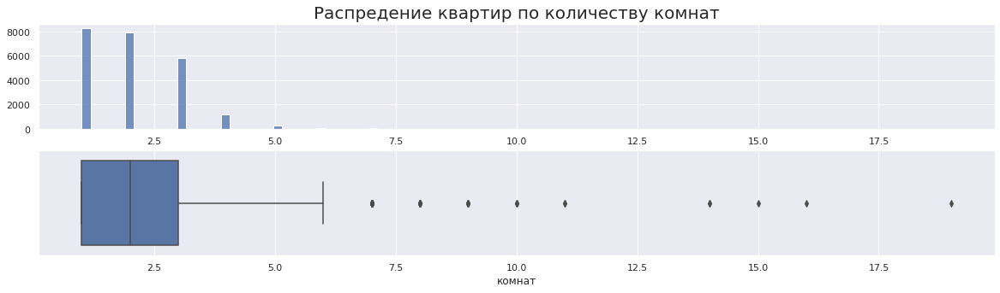

In [38]:
hist_boxplot(data['rooms'], 100, 'Распредение квартир по количеству комнат', 'комнат', '')

С комнатами разобрались, хотя можно было еще и выбросы тоже удалить из датасета.

Перейдем к высоте потолков

In [39]:
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000,108.0,2019-03-07,3,2.70,16.0,51.0,8,NaN,...,25.0,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000,40.4,2018-12-04,1,NaN,11.0,18.6,1,NaN,...,11.0,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000,56.0,2015-08-20,2,NaN,5.0,34.3,4,NaN,...,8.3,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000,159.0,2015-07-24,3,NaN,14.0,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000,100.0,2018-06-19,2,3.03,14.0,32.0,13,NaN,...,41.0,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0


In [40]:
data['ceiling_height'].unique()

array([  2.7 ,    nan,   3.03,   2.5 ,   2.67,   2.56,   3.05,   2.75,
         2.6 ,   2.9 ,   2.8 ,   2.55,   3.  ,   2.65,   3.2 ,   2.61,
         3.25,   3.45,   2.77,   2.85,   2.64,   2.57,   4.15,   3.3 ,
         2.71,   4.  ,   2.47,   2.73,   2.84,   3.1 ,   2.34,   3.4 ,
         3.5 ,   3.06,   2.72,   2.54,   2.51,   2.78,   2.76,  25.  ,
         2.58,   3.7 ,   2.52,   5.2 ,   2.87,   2.66,   2.59,   2.  ,
         2.45,   3.6 ,   2.92,   3.11,   3.13,   3.8 ,   3.15,   3.55,
         3.16,   3.62,   3.12,   2.53,   2.74,   2.96,   2.46,   5.  ,
         2.79,   2.95,   4.06,   2.94,   3.54,   3.53,   2.83,   2.4 ,
         3.38,   3.01,   5.6 ,   3.65,   3.9 ,   3.18,   3.35,   2.3 ,
         3.57,   2.48,   2.62,   2.82,   3.98,   2.63,   3.83,   3.52,
         3.95,   3.75,   2.88,   3.67,   3.87,   3.66,   3.86,   4.19,
         3.24,   4.8 ,   4.5 ,   4.2 ,   3.36,  32.  ,   3.08,   3.68,
         3.07,   3.37,   3.09,   8.  ,   3.26,   3.34,   2.81,   3.44,
      

`create_report(data['ceiling_height'])`

<img typeof="foaf:Image" src="https://i.postimg.cc/zXvC091L/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/nLG9HkJb/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/Dwq8ggmJ/image.jpg" alt="">

Для начала поборемся с выбросами.

In [41]:
data[(data['ceiling_height']<2)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
5697,5,1500000,42.8,2017-08-14,2,1.20,2.0,27.5,1,NaN,...,5.20,NaN,городской посёлок Мга,NaN,NaN,NaN,NaN,NaN,NaN,248.0
16892,5,4100000,40.0,2017-10-17,1,1.75,37.0,17.4,5,NaN,...,8.34,NaN,Санкт-Петербург,18732.0,20444.0,0.0,NaN,3.0,80.0,71.0
22536,16,6000000,55.0,2018-10-31,2,1.00,12.0,32.4,7,NaN,...,10.00,NaN,Санкт-Петербург,33053.0,14217.0,2.0,293.0,2.0,289.0,13.0


Скорее всего, это опечатки, можно было бы эти значения заменить на None или на рандомные, но мы убьем эти три строки, только позже,сначала разберемся с пропусками. Пока же посмотрим на потолки выше 4 метров.

In [42]:
data[(data['ceiling_height']>4)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
154,1,8200000,80.0,2018-11-06,3,4.15,3.0,44.2,2,NaN,...,12.2,NaN,Санкт-Петербург,20562.0,3167.0,2.0,344.0,1.0,838.0,38.0
354,17,3600000,55.2,2018-07-12,2,25.00,5.0,32.0,2,False,...,NaN,2.0,Гатчина,NaN,NaN,NaN,NaN,NaN,NaN,259.0
463,15,66571000,280.3,2015-06-11,6,5.20,8.0,159.5,7,NaN,...,21.1,0.0,Санкт-Петербург,26316.0,6655.0,3.0,187.0,1.0,616.0,578.0
1048,13,550000,29.0,2018-02-01,1,5.00,3.0,NaN,1,False,...,NaN,NaN,Бокситогорск,NaN,NaN,NaN,NaN,NaN,NaN,6.0
1124,20,6695000,36.9,2018-09-28,1,4.06,5.0,22.0,2,NaN,...,7.2,NaN,Санкт-Петербург,21725.0,2990.0,1.0,596.0,1.0,866.0,110.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22003,2,8550000,75.1,2017-08-09,3,4.20,6.0,52.5,3,NaN,...,8.0,NaN,Санкт-Петербург,23060.0,2602.0,1.0,584.0,0.0,NaN,477.0
22256,20,5300000,45.0,2017-09-30,1,10.30,16.0,15.5,15,NaN,...,NaN,NaN,Санкт-Петербург,36353.0,11936.0,2.0,440.0,2.0,450.0,136.0
22283,19,9999000,92.4,2019-04-05,2,32.00,6.0,55.5,5,False,...,16.5,4.0,Санкт-Петербург,18838.0,3506.0,0.0,NaN,3.0,511.0,NaN
22814,0,15000000,25.0,2018-07-25,1,100.00,5.0,14.0,5,True,...,11.0,5.0,Санкт-Петербург,34963.0,8283.0,1.0,223.0,3.0,30.0,19.0


In [43]:
data[(data['ceiling_height']>4)]['ceiling_height'].unique()

array([  4.15,  25.  ,   5.2 ,   5.  ,   4.06,   5.6 ,   4.19,   4.8 ,
         4.5 ,   4.2 ,  32.  ,   8.  ,   4.37,  27.  ,   4.1 ,  24.  ,
        26.  ,   8.3 ,   4.4 ,   4.45,   5.5 ,   4.3 ,   5.3 ,  14.  ,
         4.14,   4.25,  20.  ,   4.7 ,  22.6 ,   5.8 ,  27.5 ,  10.3 ,
       100.  ])

Значений больше 4 метров достаточно. но опять Питер, дворцы... Предположим, что квартиры с высотой до 6 метров включительно мы рассмотриваем, что остается?

In [44]:
len(data[(data['ceiling_height']>6)])

29

In [45]:
data[(data['ceiling_height']>6)]['ceiling_height'].unique()

array([ 25. ,  32. ,   8. ,  27. ,  24. ,  26. ,   8.3,  14. ,  20. ,
        22.6,  27.5,  10.3, 100. ])

In [46]:
data[(data['ceiling_height']>6)].head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
354,17,3600000,55.2,2018-07-12,2,25.0,5.0,32.0,2,False,...,NaN,2.0,Гатчина,NaN,NaN,NaN,NaN,NaN,NaN,259.0
3136,14,2900000,75.0,2018-11-12,3,32.0,3.0,53.0,2,NaN,...,8.0,NaN,Волхов,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3462,3,1400000,30.0,2018-03-16,1,8.0,5.0,15.3,2,False,...,7.3,NaN,деревня Нурма,NaN,NaN,NaN,NaN,NaN,NaN,125.0
4631,0,4300000,45.0,2018-02-01,2,25.0,9.0,30.0,2,NaN,...,7.0,1.0,Санкт-Петербург,12016.0,13256.0,1.0,658.0,1.0,331.0,181.0
4864,7,3000000,25.0,2017-09-27,1,27.0,25.0,17.0,17,NaN,...,NaN,2.0,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,28.0


Логичнее их было бы все отбросить, но явные опечатки начинающиеся с 2 мы можем пофиксить.

In [47]:
data.loc[(data['ceiling_height'] == 25), 'ceiling_height'] = 2.5
data.loc[(data['ceiling_height'] == 32), 'ceiling_height'] = 3.2
data.loc[(data['ceiling_height'] == 27), 'ceiling_height'] = 2.7
data.loc[(data['ceiling_height'] == 24), 'ceiling_height'] = 2.4
data.loc[(data['ceiling_height'] == 26), 'ceiling_height'] = 2.6
data.loc[(data['ceiling_height'] == 22.6), 'ceiling_height'] = 2.6
data.loc[(data['ceiling_height'] == 27.5), 'ceiling_height'] = 2.5
data[(data['ceiling_height']>6)]['ceiling_height'].unique()

array([  8. ,   8.3,  14. ,  20. ,  10.3, 100. ])

In [48]:
data[(data['ceiling_height']>6)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
3462,3,1400000,30.0,2018-03-16,1,8.0,5.0,15.3,2,False,...,7.3,NaN,деревня Нурма,NaN,NaN,NaN,NaN,NaN,NaN,125.0
5848,20,5650000,45.0,2018-08-15,1,8.3,16.0,19.3,14,NaN,...,8.3,1.0,Санкт-Петербург,13069.0,10763.0,0.0,NaN,1.0,613.0,14.0
15026,19,5600000,56.4,2018-05-11,2,14.0,14.0,32.4,5,NaN,...,9.1,2.0,Санкт-Петербург,14814.0,13610.0,0.0,NaN,0.0,NaN,315.0
15705,14,5600000,67.0,2016-11-11,3,8.0,16.0,41.0,1,NaN,...,8.0,NaN,Санкт-Петербург,32691.0,11035.0,1.0,723.0,0.0,NaN,474.0
17400,0,5350000,54.0,2015-06-16,2,8.0,5.0,29.0,2,NaN,...,NaN,1.0,Красное Село,24638.0,28062.0,0.0,NaN,0.0,NaN,469.0
17454,15,6700000,92.9,2019-02-19,3,20.0,17.0,53.2,14,NaN,...,12.0,5.0,Санкт-Петербург,16295.0,15092.0,1.0,967.0,0.0,NaN,NaN
22256,20,5300000,45.0,2017-09-30,1,10.3,16.0,15.5,15,NaN,...,NaN,NaN,Санкт-Петербург,36353.0,11936.0,2.0,440.0,2.0,450.0,136.0
22814,0,15000000,25.0,2018-07-25,1,100.0,5.0,14.0,5,True,...,11.0,5.0,Санкт-Петербург,34963.0,8283.0,1.0,223.0,3.0,30.0,19.0


Из оставшихся 8 с большой натяжкой можно признать 15706 как похожий на правду, так как это 1 этаж, но не будем гадать на кофейной гуще и убьем эти строки.

Заменим пропущенные значения на медиану.

In [49]:
data['ceiling_height'].median()

2.65

In [50]:
data['ceiling_height'].describe()

count    14466.000000
mean         2.734726
std          0.877562
min          1.000000
25%          2.510000
50%          2.650000
75%          2.800000
max        100.000000
Name: ceiling_height, dtype: float64

In [51]:
data['ceiling_height'].fillna(data['ceiling_height'].median(), inplace=True)

In [52]:
data['ceiling_height'].describe()

count    23643.000000
mean         2.701839
std          0.687669
min          1.000000
25%          2.600000
50%          2.650000
75%          2.700000
max        100.000000
Name: ceiling_height, dtype: float64

Теперь убиваем лишнее

In [53]:
data = data[(data['ceiling_height']>=2)].reset_index(drop=True)
len(data)

23640

In [54]:
data = data[(data['ceiling_height']<=6)].reset_index(drop=True)
len(data)

23632

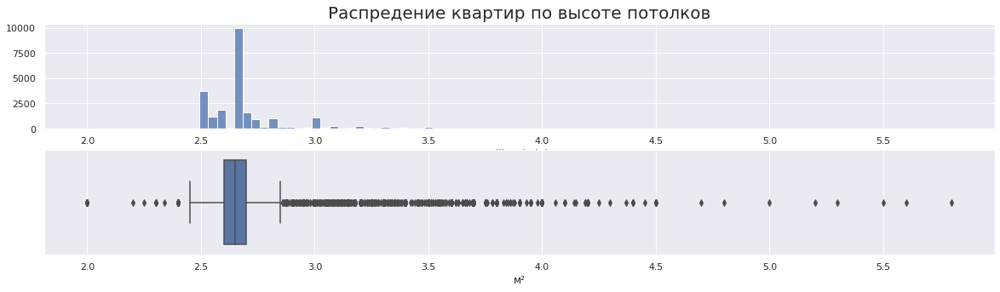

In [55]:
hist_boxplot(data['ceiling_height'], 100, 'Распредение квартир по высоте потолков', 'м²', '')

Как и ожидалось, стандартные потолки от 2.4 до 2.7 метра.

Смотрим, что у нас с количеством этажей в доме.

Заменим тип данных на `int` .

`create_report(data['floors_total'])`

<img typeof="foaf:Image" src="https://i.postimg.cc/bv5HnPJH/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/VNHprV2Q/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/hvRCVWrw/image.jpg" alt="">

У нас 86 нулевых значений, для количества этажей в доме это очень странно. Посмотрим, какие варианты у нас есть

In [56]:
data['floors_total'].unique()

array([16., 11.,  5., 14., 12., 26., 24., 27.,  9.,  6., 17., 25.,  3.,
       23., 19., 18.,  4., 22.,  8.,  2., 10.,  7., 13., 15., nan, 20.,
       28., 36., 21., 35., 34., 60.,  1., 29., 33., 52.])

Проверим, есть ли у нас строки, где количество этажей в доме меньше этажа продаваемой квартиры:

In [57]:
data[data['floors_total']<data['floor']][['floors_total', 'floor']]

,floors_total,floor


Таких вариантов не встретилось, значит нам нужно заполнить пропущенные значения в `floors_total`, отталикаваясь от медианы по существующим значениям.

In [58]:
floors_total_median = data.groupby('floor')['floors_total'].median().to_dict()
floors_total_median

{1: 5.0,
 2: 5.0,
 3: 5.0,
 4: 5.0,
 5: 6.0,
 6: 9.0,
 7: 10.0,
 8: 10.0,
 9: 10.0,
 10: 16.0,
 11: 16.0,
 12: 16.0,
 13: 17.0,
 14: 17.0,
 15: 17.0,
 16: 18.0,
 17: 22.0,
 18: 22.0,
 19: 24.0,
 20: 24.0,
 21: 25.0,
 22: 25.0,
 23: 25.0,
 24: 25.0,
 25: 25.0,
 26: 27.0,
 27: 27.0,
 28: 36.0,
 29: 36.0,
 30: 35.0,
 31: 35.0,
 32: 33.0,
 33: 35.0}

In [59]:
data[data['floors_total'].isna()].head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
185,12,11640000,65.2,2018-10-02,2,2.65,NaN,30.80,4,NaN,...,12.00,NaN,Санкт-Петербург,39197.0,12373.0,1.0,123.0,0.0,NaN,49.0
236,4,2438033,28.1,2016-11-23,1,2.65,NaN,20.75,1,NaN,...,NaN,0.0,Санкт-Петербург,22041.0,17369.0,0.0,NaN,1.0,374.0,251.0
456,4,9788348,70.8,2015-08-01,2,2.65,NaN,38.40,12,NaN,...,10.63,0.0,Санкт-Петербург,37364.0,8322.0,2.0,309.0,2.0,706.0,727.0
668,4,6051191,93.6,2017-04-06,3,2.65,NaN,47.10,8,NaN,...,16.80,0.0,Санкт-Петербург,22041.0,17369.0,0.0,NaN,1.0,374.0,123.0
1749,5,3600000,39.0,2017-04-22,1,2.65,NaN,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,22735.0,11618.0,1.0,835.0,1.0,652.0,77.0


In [60]:
len(data[data['floors_total'].isna()])

86

In [61]:
data.loc[data['floors_total'].isna(), 'floors_total'] = data['floor'].map(floors_total_median)

In [62]:
len(data[data['floors_total'].isna()])

0

In [63]:
data[data['floors_total'].isna()].head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition


In [64]:
data.iloc[185:186]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
185,12,11640000,65.2,2018-10-02,2,2.65,5.0,30.8,4,NaN,...,12.0,NaN,Санкт-Петербург,39197.0,12373.0,1.0,123.0,0.0,NaN,49.0


Заменили, проверили. Теперь у нас общее количество этажей заменено за медианное значение (до сбоя тренажера я отрабатывал оба варианта, поэтому медиана была выбрана сознательно - среднее смотрелось менее объективно). 

Меняем тип данных на `int`

In [65]:
data['floors_total'] = data['floors_total'].astype('int')

Теперь исследуем жилую площадь. Как мы помним, у нас там есть пропуски.

`create_report(data['living_area'])`

<img typeof="foaf:Image" src="https://i.postimg.cc/YqqMGfKz/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/3rfb1g0B/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/WpxxjGp4/image.jpg" alt="">

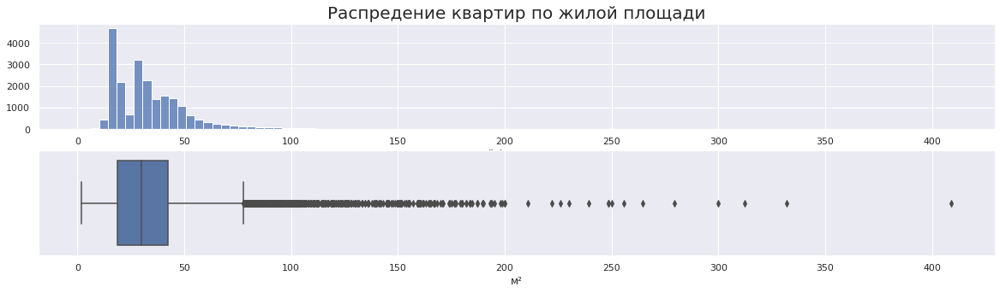

In [66]:
hist_boxplot(data['living_area'], 100, 'Распредение квартир по жилой площади', 'м²', '')

У нас есть строки, где жилая площадь равна 2. проверим, есть ли строки, где жилая площадь больше общей

In [67]:
data[data['living_area'] > data['total_area']]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition


К счастью таких объектов нет. Посмотри, что у нас с квартирами, где жилая площадь меньше кухни.

In [68]:
data[data['living_area'] < data['kitchen_area']]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
4,2,10000000,100.00,2018-06-19,2,3.03,14,32.00,13,NaN,...,41.00,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0
6,6,3700000,37.30,2017-11-02,1,2.65,26,10.60,6,NaN,...,14.40,1.0,посёлок Парголово,52996.0,19143.0,0.0,NaN,0.0,NaN,155.0
51,7,45000000,161.00,2017-10-17,3,3.20,8,38.00,4,NaN,...,50.00,NaN,Санкт-Петербург,32537.0,6589.0,0.0,NaN,3.0,99.0,541.0
53,7,4300000,39.10,2017-11-10,1,2.65,25,15.40,13,NaN,...,15.50,2.0,посёлок Парголово,52611.0,18783.0,0.0,NaN,0.0,NaN,6.0
101,4,3000000,37.00,2019-03-23,1,2.75,10,12.00,3,NaN,...,13.00,NaN,садовое товарищество Новая Ропша,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23321,7,5400000,43.00,2017-04-24,1,2.65,18,12.00,8,NaN,...,20.00,0.0,Санкт-Петербург,25108.0,15940.0,0.0,NaN,0.0,NaN,124.0
23414,1,3000000,37.29,2019-04-15,1,2.65,19,10.08,10,NaN,...,16.88,NaN,Санкт-Петербург,37006.0,15157.0,0.0,NaN,0.0,NaN,7.0
23506,8,6290000,47.67,2019-03-20,1,3.60,12,13.59,12,NaN,...,17.87,2.0,Санкт-Петербург,35726.0,16028.0,1.0,253.0,2.0,99.0,19.0
23507,14,64990000,139.00,2015-11-24,3,3.00,8,3.00,8,NaN,...,16.00,1.0,Санкт-Петербург,33255.0,5975.0,1.0,630.0,3.0,100.0,280.0


У нас 352 объекта с такими характеристиками. Можно допустить, что такие квартиры существуют: кухня, комната и множество коридоров. А есть ли у нас варианты где общая площадь меньше жилой площади и площади кухни?

In [69]:
data[data['total_area'] < data['living_area'] + data['kitchen_area']]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
183,7,2600000,30.20,2018-02-14,1,2.65,9,26.10,5,NaN,...,6.20,NaN,Санкт-Петербург,13952.0,15031.0,0.0,NaN,1.0,824.0,12.0
542,9,4700000,23.80,2018-12-28,1,2.65,18,20.00,9,NaN,...,5.00,NaN,Санкт-Петербург,9731.0,11849.0,0.0,NaN,0.0,NaN,108.0
548,8,3100000,31.59,2018-03-08,1,2.70,19,30.55,2,NaN,...,9.28,2.0,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,70.0
598,12,5600000,53.70,2017-04-18,2,2.50,12,48.30,5,NaN,...,7.00,2.0,Санкт-Петербург,50477.0,13252.0,2.0,220.0,1.0,1250.0,167.0
693,1,3364930,34.69,2014-11-27,1,2.64,25,23.43,25,NaN,...,23.43,2.0,Санкт-Петербург,43396.0,12153.0,0.0,NaN,0.0,NaN,574.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21765,20,2450000,44.00,2019-02-12,2,2.70,2,38.00,2,False,...,8.60,2.0,городской поселок Большая Ижора,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21809,12,2600000,34.30,2018-09-26,1,2.50,9,30.60,6,NaN,...,8.00,2.0,Сосновый Бор,NaN,NaN,NaN,NaN,NaN,NaN,107.0
21856,14,11990000,91.40,2016-05-16,2,2.65,16,62.00,12,NaN,...,32.40,0.0,Санкт-Петербург,10934.0,12551.0,0.0,NaN,0.0,NaN,93.0
21895,0,5200000,46.00,2018-07-20,2,2.65,5,44.00,5,NaN,...,8.00,1.0,Санкт-Петербург,14103.0,15182.0,1.0,488.0,0.0,NaN,7.0


Вот эти 64 варианта точно содержат ошибки, мы не можем установить, какие из 3 колонок в том или ином случае содержат ошибки, поэтому мы их удалим после того, как заполним пропущенные значения.

In [70]:
data_ratio = data.copy(deep=True)
data_ratio = data_ratio[['total_area', 'living_area', 'rooms']]
data_ratio

,total_area,living_area,rooms
0,108.00,51.0,3
1,40.40,18.6,1
2,56.00,34.3,2
3,159.00,NaN,3
4,100.00,32.0,2
...,...,...,...
23627,133.81,73.3,3
23628,59.00,38.0,3
23629,56.70,29.7,2
23630,76.75,NaN,2


In [71]:
data_ratio['division'] = data_ratio['total_area']/data_ratio['living_area']
data_ratio

,total_area,living_area,rooms,division
0,108.00,51.0,3,2.117647
1,40.40,18.6,1,2.172043
2,56.00,34.3,2,1.632653
3,159.00,NaN,3,NaN
4,100.00,32.0,2,3.125000
...,...,...,...,...
23627,133.81,73.3,3,1.825512
23628,59.00,38.0,3,1.552632
23629,56.70,29.7,2,1.909091
23630,76.75,NaN,2,NaN


In [72]:
data_ratio_cof = data_ratio.groupby('rooms')['division'].median().to_dict()
data_ratio_cof

{1: 2.0625,
 2: 1.709375,
 3: 1.5827393289857272,
 4: 1.5157458941410826,
 5: 1.5281474440219687,
 6: 1.4660186310247063,
 7: 1.4533521126760562,
 8: 1.5175010038816759,
 9: 1.5741911303947775,
 10: 1.5311510031678985,
 11: 1.4140690972454928,
 14: 1.5466228260345907,
 15: 1.4425427872860637,
 16: 1.5,
 19: 1.416257088846881}

Мы получили отношение жилой площади к общей. Заполним пустые значения, воспользовавшись данными коэффициентами.

In [73]:
len(data[data['living_area'].isna()])

1895

In [74]:
data.loc[data['living_area'].isna(), 'living_area'] = data['rooms'].map(data_ratio_cof)**(-1)*data['total_area']

In [75]:
len(data[data['living_area'].isna()])

0

In [76]:
data[data['total_area'] < data['living_area'] + data['kitchen_area']]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
183,7,2600000,30.20,2018-02-14,1,2.65,9,26.10,5,NaN,...,6.20,NaN,Санкт-Петербург,13952.0,15031.0,0.0,NaN,1.0,824.0,12.0
542,9,4700000,23.80,2018-12-28,1,2.65,18,20.00,9,NaN,...,5.00,NaN,Санкт-Петербург,9731.0,11849.0,0.0,NaN,0.0,NaN,108.0
548,8,3100000,31.59,2018-03-08,1,2.70,19,30.55,2,NaN,...,9.28,2.0,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,70.0
598,12,5600000,53.70,2017-04-18,2,2.50,12,48.30,5,NaN,...,7.00,2.0,Санкт-Петербург,50477.0,13252.0,2.0,220.0,1.0,1250.0,167.0
693,1,3364930,34.69,2014-11-27,1,2.64,25,23.43,25,NaN,...,23.43,2.0,Санкт-Петербург,43396.0,12153.0,0.0,NaN,0.0,NaN,574.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21765,20,2450000,44.00,2019-02-12,2,2.70,2,38.00,2,False,...,8.60,2.0,городской поселок Большая Ижора,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21809,12,2600000,34.30,2018-09-26,1,2.50,9,30.60,6,NaN,...,8.00,2.0,Сосновый Бор,NaN,NaN,NaN,NaN,NaN,NaN,107.0
21856,14,11990000,91.40,2016-05-16,2,2.65,16,62.00,12,NaN,...,32.40,0.0,Санкт-Петербург,10934.0,12551.0,0.0,NaN,0.0,NaN,93.0
21895,0,5200000,46.00,2018-07-20,2,2.65,5,44.00,5,NaN,...,8.00,1.0,Санкт-Петербург,14103.0,15182.0,1.0,488.0,0.0,NaN,7.0


Так как мы не учитывали размер кухни в наших расчетах, то 64 строки запланированные к удалению пополнились на 8, соответсвенно нам будет нужно удалить предварительно 76 строк, но сделаем мы это только после того, как устраним или исправим пропущенные значения в площади кухни, пока же проверяем, что у нас получилось.

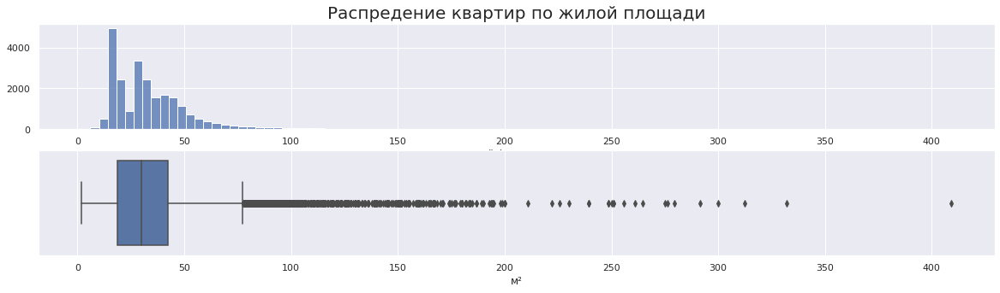

In [77]:
hist_boxplot(data['living_area'], 100, 'Распредение квартир по жилой площади', 'м²', '')

In [78]:
data['living_area'].describe()

count    23632.000000
mean        34.336884
std         21.214385
min          2.000000
25%         18.700000
50%         30.000000
75%         42.200000
max        409.000000
Name: living_area, dtype: float64

У нас все еще есть очень маленькие значения. Отталкиваемся от того, что комната вряд ли может быть меньше 8 метров (Я верю в Питер).

In [79]:
data[data['living_area'] < 8]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
3230,7,4440000,41.0,2017-07-02,1,2.65,17,3.000000,17,NaN,...,11.0,NaN,Санкт-Петербург,19272.0,13073.0,0.0,NaN,0.0,NaN,216.0
12011,5,1900000,15.0,2018-06-27,1,2.50,5,7.272727,1,NaN,...,NaN,NaN,Сосновый Бор,NaN,NaN,NaN,NaN,NaN,NaN,45.0
13879,20,6350000,52.0,2018-02-06,2,3.00,6,2.000000,2,NaN,...,9.0,NaN,Санкт-Петербург,32453.0,6521.0,0.0,NaN,1.0,1012.0,91.0
16388,13,3799000,31.0,2018-04-12,1,2.60,5,6.000000,1,NaN,...,17.0,NaN,Санкт-Петербург,32177.0,4826.0,1.0,430.0,0.0,NaN,168.0
16901,9,1550000,15.0,2018-08-21,1,2.70,9,7.272727,1,NaN,...,NaN,NaN,Санкт-Петербург,51048.0,16376.0,0.0,NaN,1.0,1079.0,42.0
17532,11,2680000,22.0,2018-08-11,1,2.65,25,5.000000,8,NaN,...,NaN,2.0,Санкт-Петербург,22735.0,11618.0,1.0,835.0,1.0,652.0,70.0
17910,3,1400000,13.0,2017-12-03,1,2.60,9,6.303030,1,NaN,...,NaN,NaN,Санкт-Петербург,14350.0,15945.0,0.0,NaN,1.0,185.0,410.0
19199,19,4050000,33.0,2018-10-15,1,2.50,22,6.500000,21,NaN,...,18.0,NaN,Санкт-Петербург,9258.0,10592.0,1.0,458.0,0.0,NaN,44.0
19492,3,1850000,13.0,2019-03-11,1,3.40,5,6.303030,2,False,...,NaN,NaN,Санкт-Петербург,24915.0,5483.0,1.0,644.0,0.0,NaN,24.0
19504,2,1686000,13.2,2018-12-17,1,2.65,5,6.400000,1,NaN,...,NaN,NaN,Санкт-Петербург,19891.0,4165.0,1.0,361.0,1.0,155.0,19.0


Не будем гадать, удаляем их из датафрейма.

In [80]:
data = data[data['living_area'] > 8]

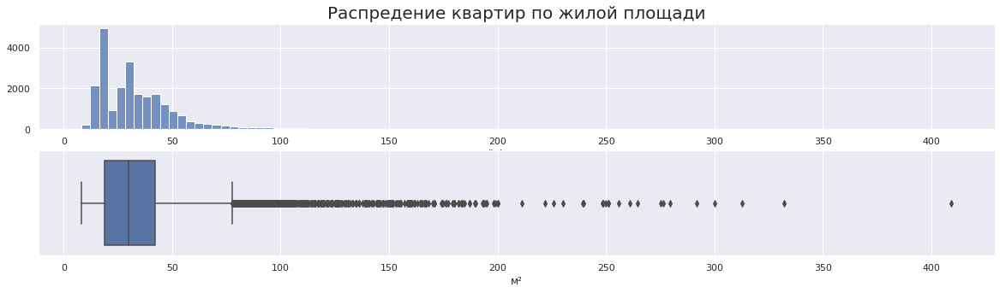

In [81]:
hist_boxplot(data['living_area'], 100, 'Распредение квартир по жилой площади', 'м²', '')

Выбросы сверху не трогаем, помним, что у нас есть нереальные суммы жилой площади с кухней, превышающими общую площадь.

А теперь взглянем на этажи, на которых расположены квартиры.

In [82]:
data.floor.describe()

count    23617.000000
mean         5.891688
std          4.885342
min          1.000000
25%          2.000000
50%          4.000000
75%          8.000000
max         33.000000
Name: floor, dtype: float64

Всё выглядит похожим на правду.

Смотрим, что у нас с апартаментами.

In [83]:
data.is_apartment.describe()

count      2766
unique        2
top       False
freq       2718
Name: is_apartment, dtype: object

In [84]:
len(data[data['is_apartment'].isna()])

20851

In [85]:
data.is_apartment.value_counts()

False    2718
True       48
Name: is_apartment, dtype: int64

То ли апартаменты не строят, то ли, продавцы умалчивают. Но мы работаем с данными, поэтому в данной ситуации нам приходится полагаться на достоверность предоставленной продавцом информации. Меняем пропущенные значения на `False`

In [86]:
data['is_apartment'].fillna(0, inplace=True)

In [87]:
data['is_apartment'] = data['is_apartment'].astype(bool)

In [88]:
data.is_apartment.value_counts()

False    23569
True        48
Name: is_apartment, dtype: int64

Данные поправлены, смотрим студии.

In [89]:
data.studio.describe()

count     23617
unique        2
top       False
freq      23470
Name: studio, dtype: object

Все корректно, смотрим свободную планировку.

In [90]:
data.open_plan.describe()

count     23617
unique        2
top       False
freq      23551
Name: open_plan, dtype: object

Все корректно, смотрим площадь кухни.

In [91]:
data['kitchen_area'].describe()

count    21358.000000
mean        10.505644
std          5.661444
min          1.300000
25%          7.000000
50%          9.100000
75%         12.000000
max        100.700000
Name: kitchen_area, dtype: float64

In [92]:
len(data[data['kitchen_area'].isna()])

2259

`create_report(data['kitchen_area'])`

<img typeof="foaf:Image" src="https://i.postimg.cc/9MmK8JWK/image.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/ZRs7fmsv/2.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/Bb1gMK1R/3.jpg" alt="">
<img typeof="foaf:Image" src="https://i.postimg.cc/B6jkftKB/4.jpg" alt="">

В кухню 1.3 квадратных метра я еще могу поверить с натяжкой, если продавец просто "зонировал" свою студию например,я точно могу поверить в кухни больше 60 квадратных метров, но как мы видим 95% значений меньше 20 м2. Посмотрим, сколько у нас значений больше 60 м2.

In [93]:
data[data['kitchen_area'] >= 60]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
1080,16,75000000,323.0,2017-07-10,5,4.00,5,255.7,4,False,...,66.0,NaN,Санкт-Петербург,23713.0,594.0,3.0,398.0,2.0,515.0,259.0
2479,9,12500000,255.0,2017-04-21,3,2.65,2,153.9,2,False,...,100.7,0.0,Санкт-Петербург,29544.0,6916.0,0.0,NaN,3.0,198.0,102.0
3548,5,12300000,115.0,2017-08-09,3,2.70,20,45.0,16,False,...,60.0,1.0,Санкт-Петербург,33386.0,14234.0,0.0,NaN,0.0,NaN,63.0
4381,20,57000000,174.0,2015-11-09,3,3.20,10,95.0,6,False,...,77.0,NaN,Санкт-Петербург,31706.0,4166.0,1.0,193.0,3.0,199.0,1039.0
5344,20,65000000,590.0,2019-02-14,15,3.50,6,409.0,3,False,...,100.0,NaN,Санкт-Петербург,24447.0,4666.0,1.0,767.0,0.0,NaN,14.0
6173,19,24300000,230.0,2016-06-03,4,2.65,3,90.0,2,False,...,70.0,0.0,Санкт-Петербург,39422.0,15354.0,0.0,NaN,1.0,345.0,397.0
10840,1,56844500,177.9,2015-01-15,3,2.65,6,87.2,5,True,...,87.2,NaN,Санкт-Петербург,21860.0,318.0,2.0,160.0,3.0,569.0,NaN
13105,20,55000000,288.0,2017-11-14,5,3.51,6,100.7,2,False,...,62.0,NaN,Санкт-Петербург,26228.0,4930.0,2.0,175.0,1.0,682.0,338.0
13810,12,65000000,250.0,2014-12-09,5,3.10,5,167.0,5,False,...,60.0,1.0,Санкт-Петербург,23553.0,1862.0,3.0,286.0,3.0,577.0,714.0
14608,17,47000000,150.0,2017-02-28,4,3.70,6,58.0,5,False,...,75.0,1.0,Санкт-Петербург,16085.0,7616.0,0.0,NaN,0.0,NaN,507.0


Так как нас не очень сильно интересует элитная недвижимость, тем более, что она влияет на искажение картины в целом, удалим эти 18 значений.

In [94]:
data = data[(data['kitchen_area'] < 60)|(data['kitchen_area'].isna())]
len(data)

23599

Теперь поработаем с пропущенными значениями.

In [95]:
data_kitchen_area_median = data.groupby('rooms')['kitchen_area'].median().to_dict()
data_kitchen_area_median

{1: 9.01,
 2: 8.745000000000001,
 3: 9.5,
 4: 11.0,
 5: 15.0,
 6: 19.0,
 7: 18.9,
 8: 24.3,
 9: 13.75,
 10: 19.8,
 11: 12.600000000000001,
 14: 21.25,
 16: 13.0,
 19: 27.6}

In [96]:
data_kitchen_area_mean = data.groupby('rooms')['kitchen_area'].mean().to_dict()
data_kitchen_area_mean

{1: 9.54643442054131,
 2: 9.956203627370147,
 3: 11.146272388059685,
 4: 13.375992509363288,
 5: 16.679179104477615,
 6: 20.642087912087916,
 7: 20.199999999999996,
 8: 22.35,
 9: 20.916666666666668,
 10: 22.866666666666664,
 11: 12.600000000000001,
 14: 21.25,
 16: 13.0,
 19: 27.6}

In [97]:
data[(data['rooms'] ==1)]['kitchen_area'].describe()

count    7205.000000
mean        9.546434
std         3.307624
min         1.300000
25%         7.200000
50%         9.010000
75%        11.000000
max        58.400000
Name: kitchen_area, dtype: float64

Следует позавидовать размеру питерских кухонь :) ДЛя заполнения будем использовать медиану.

In [98]:
len(data[data['kitchen_area'].isna()])

2259

In [99]:
data[data['kitchen_area'].isna()].head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
3,0,64900000,159.0,2015-07-24,3,2.65,14,100.458741,9,False,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
30,12,2200000,32.8,2018-02-19,1,2.65,9,15.903030,2,False,...,NaN,NaN,Коммунар,NaN,NaN,NaN,NaN,NaN,NaN,63.0
37,10,1990000,45.8,2017-10-28,2,2.50,5,26.793419,1,False,...,NaN,NaN,поселок городского типа Красный Бор,NaN,NaN,NaN,NaN,NaN,NaN,196.0
44,13,5350000,40.0,2018-11-18,1,2.65,22,19.393939,3,False,...,NaN,1.0,Санкт-Петербург,30471.0,11603.0,1.0,620.0,1.0,1152.0,NaN
59,15,6300000,46.5,2017-03-06,1,2.65,13,22.545455,13,False,...,NaN,NaN,Санкт-Петербург,11125.0,14501.0,0.0,NaN,0.0,NaN,336.0


In [100]:
data.loc[data['kitchen_area'].isna(), 'kitchen_area'] = data['rooms'].map(data_kitchen_area_median)

In [101]:
len(data[data['kitchen_area'].isna()])

0

In [102]:
data.iloc[3:4]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
3,0,64900000,159.0,2015-07-24,3,2.65,14,100.458741,9,False,...,9.5,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0


In [103]:
data.iloc[30:31]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
30,12,2200000,32.8,2018-02-19,1,2.65,9,15.90303,2,False,...,9.01,NaN,Коммунар,NaN,NaN,NaN,NaN,NaN,NaN,63.0


In [104]:
len(data)

23599

В обоих проверенных случаях замена показала так себе результаты, но они правдоподобны.

Проверим наконец квартиры у которых общая площадь меньше суммы плодащей жилой и кухни.

In [105]:
data[data['total_area'] < data['living_area'] + data['kitchen_area']]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
183,7,2600000,30.20,2018-02-14,1,2.65,9,26.10,5,False,...,6.20,NaN,Санкт-Петербург,13952.0,15031.0,0.0,NaN,1.0,824.0,12.0
236,4,2438033,28.10,2016-11-23,1,2.65,5,20.75,1,False,...,9.01,0.0,Санкт-Петербург,22041.0,17369.0,0.0,NaN,1.0,374.0,251.0
348,4,2320000,25.00,2017-09-27,1,2.65,14,17.00,1,False,...,9.01,0.0,деревня Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,45.0
439,8,2480000,27.11,2018-03-12,1,2.65,17,24.75,4,False,...,9.01,2.0,Санкт-Петербург,38171.0,15015.0,0.0,NaN,2.0,982.0,64.0
542,9,4700000,23.80,2018-12-28,1,2.65,18,20.00,9,False,...,5.00,NaN,Санкт-Петербург,9731.0,11849.0,0.0,NaN,0.0,NaN,108.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23124,3,1900000,18.90,2016-04-04,1,2.65,16,16.00,12,False,...,9.01,0.0,Тосно,NaN,NaN,NaN,NaN,NaN,NaN,115.0
23135,13,4919880,67.92,2018-10-23,2,2.65,3,63.00,3,False,...,13.04,NaN,Всеволожск,NaN,NaN,NaN,NaN,NaN,NaN,60.0
23143,7,3200000,26.00,2017-09-01,1,2.65,25,18.00,16,False,...,9.01,0.0,Санкт-Петербург,11405.0,13222.0,0.0,NaN,1.0,623.0,14.0
23512,7,2350000,24.80,2018-06-07,1,2.65,10,18.00,2,False,...,9.01,NaN,Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,89.0


Наши заполнения увеличили количество ошибок с 76 до 320.

Эти строки спасать смысла нет, это нетипные значения, так как кухня+ванна статистически должны быть больше 8 м2. Плюс хотя бы 2,5 метра предусмтриваем на ванну с туалетом. Уберем нетипичное.

In [106]:
data = data[(data['total_area'] >= data['living_area'] + data['kitchen_area']+2.5)]
len(data)

23011

С кухнями закончили, переходим к балконам

In [107]:
data['balcony'].describe()

count    11813.000000
mean         1.145772
std          1.071558
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          5.000000
Name: balcony, dtype: float64

есть пропуски и неудобный тип данных для целочисленных значений. Исходим из того, что если пропуск, то балкнов 0, а потом переводим к `int`

In [108]:
data['balcony'].fillna(0.0, inplace=True)

<div class="alert alert-block alert-success">✔️
    

__Комментарий от ревьюера №1__

Согласен, если пропуск - вероятнее всего балкон отсутствует

In [109]:
data['balcony'] = data['balcony'].astype(int)

In [110]:
data['balcony'].describe()

count    23011.000000
mean         0.588197
std          0.957819
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          5.000000
Name: balcony, dtype: float64

Молча завидуем владельцу 5 балконов и идем дальше, здесь мы сделали, что смогли.

Смотрим, что у нас с местоположением квартир.

In [111]:
data['locality_name'].unique()

array(['Санкт-Петербург', 'посёлок Шушары', 'городской посёлок Янино-1',
       'посёлок Парголово', 'посёлок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок городского типа Красный Бор', 'Гатчина', 'поселок Мурино',
       'деревня Фёдоровское', 'Выборг', 'Кронштадт', 'Кировск',
       'деревня Новое Девяткино', 'посёлок Металлострой',
       'посёлок городского типа Лебяжье',
       'посёлок городского типа Сиверский', 'поселок Молодцово',
       'поселок городского типа Кузьмоловский',
       'садовое товарищество Новая Ропша', 'Павловск',
       'деревня Пикколово', 'Всеволожск', 'Волхов', 'Кингисепп',
       'Приозерск', 'Сестрорецк', 'деревня Куттузи', 'посёлок Аннино',
       'поселок городского типа Ефимовский', 'посёлок Плодовое',
       'деревня Заклинье', 'поселок Торковичи', 'поселок Первомайское',
       'Красное Село', 'посёлок Понтонный', 'Сясьстрой', 'деревня Старая',
       'деревня Лесколово', '

In [112]:
len(data['locality_name'].unique())

363

In [113]:
len(data[data['locality_name'].isna()])

47

Не люблю безымянные объекты, мы бы могли по расстоянию до центра центра, ценовым и другим параметрам найти похожие, но это достачно энергозатратно, поэтому мы их удалим.

In [114]:
len(data[data['locality_name'].isna()])

47

In [115]:
len(data[~data['locality_name'].isna()])

22964

In [116]:
data = data[~data['locality_name'].isna()]

In [117]:
len(data[data['locality_name'].isna()])

0

In [118]:
len(data)

22964

Теперь смотрим,что мы можем сделать с дубликатами названий и много ли их.

In [119]:
place_names = []
dubles = {}
for name in data['locality_name'].unique():
    name = name.replace('ё','е')
    name_list = name.split(' ')
    new_name_list = [word for word in name_list if word == word.title()]
    new_name = ' '.join(new_name_list)
    if new_name in place_names:
        if new_name in dubles.keys():
            dubles[new_name] +=1
        else:
            dubles[new_name] = 1
    else:
        place_names.append(new_name)
print(len(place_names))
print()
print(sorted(place_names))
print()
print(dubles)
print()
sum(dubles.values())

303

['Агалатово', 'Александровская', 'Алексеевка', 'Аннино', 'Аро', 'Барышево', 'Батово', 'Бегуницы', 'Белогорка', 'Белоостров', 'Бокситогорск', 'Большая Вруда', 'Большая Ижора', 'Большая Пустомержа', 'Большие Колпаны', 'Большое Рейзино', 'Большой Сабск', 'Бор', 'Борисова Грива', 'Бугры', 'Будогощь', 'Ваганово', 'Важины', 'Вартемяги', 'Вахнова Кара', 'Вещево', 'Виллози', 'Вознесенье', 'Возрождение', 'Войсковицы', 'Войскорово', 'Володарское', 'Волосово', 'Волхов', 'Всеволожск', 'Выборг', 'Вырица', 'Выскатка', 'Высокоключевой', 'Высоцк', 'Гаврилово', 'Гарболово', 'Гатчина', 'Гладкое', 'Глажево', 'Глебычево', 'Глинка', 'Гончарово', 'Горбунки', 'Гостилицы', 'Громово', 'Дзержинского', 'Дружная Горка', 'Дружноселье', 'Дубровка', 'Елизаветино', 'Ефимовский', 'Жилгородок', 'Жилпоселок', 'Житково', 'Заводской', 'Заклинье', 'Заневка', 'Запорожское', 'Зеленогорск', 'Зимитицы', 'Ивангород', 'Извара', 'Ильичево', 'Иссад', 'Калитино', 'Каложицы', 'Кальтино', 'Каменногорск', 'Камышовка', 'Каськово',

59

По цифрам бьется, есть задвоения. Не будем убивать старое название, создадим новую колонку.

In [120]:
def make_new_name(name):
    return ' '.join([word for word in name.replace('ё','е').split(' ') if word == word.title()])

data['correct_locality_name'] = data['locality_name'].apply(make_new_name)

In [121]:
data.tail()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name
23627,9,9700000,133.81,2017-03-21,3,3.70,5,73.300000,3,False,...,0,Санкт-Петербург,24665.0,4232.0,1.0,796.0,3.0,381.0,NaN,Санкт-Петербург
23628,14,3100000,59.00,2018-01-15,3,2.65,5,38.000000,4,False,...,0,Тосно,NaN,NaN,NaN,NaN,NaN,NaN,45.0,Тосно
23629,18,2500000,56.70,2018-02-11,2,2.65,3,29.700000,1,False,...,0,село Рождествено,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Рождествено
23630,13,11475000,76.75,2017-03-28,2,3.00,17,44.899452,12,False,...,2,Санкт-Петербург,39140.0,10364.0,2.0,173.0,3.0,196.0,602.0,Санкт-Петербург
23631,4,1350000,32.30,2017-07-21,1,2.50,5,12.300000,1,False,...,0,поселок Новый Учхоз,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Новый Учхоз


С названиями закончили, переходим к расстоянию до ближайшего аэропорта. Заменим тип на `int`.

In [122]:
data['airports_nearest'].describe()

count    17677.000000
mean     28850.925100
std      12655.426896
min          0.000000
25%      18565.000000
50%      26803.000000
75%      37406.000000
max      84869.000000
Name: airports_nearest, dtype: float64

In [123]:
len(data[data['airports_nearest'].isna()])

5287

Пустые значения меня меньше смущают, чем нулевые. Квартиры в аэропорту?

In [124]:
data[data['airports_nearest']<6000]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name
21026,0,7000000,34.7,2018-09-23,1,2.7,9,19.8,3,False,...,2,Санкт-Петербург,0.0,22801.0,0.0,NaN,0.0,NaN,60.0,Санкт-Петербург


In [125]:
data.loc[data['airports_nearest']<6000, 'airports_nearest'] = None
data['airports_nearest'] = pd.array(data['airports_nearest'], dtype=pd.Int64Dtype())
len(data[data['airports_nearest'].isna()])

5288

Изменили значения с 0 на `None`, остальные оставляем, как есть.

Смотрим расстояние до Центра. Заменим тип на `int`.

In [126]:
data['cityCenters_nearest'].describe()

count    17698.000000
mean     14247.553226
std       8618.598279
min        181.000000
25%       9316.000000
50%      13123.000000
75%      16315.750000
max      65968.000000
Name: cityCenters_nearest, dtype: float64

In [127]:
data['cityCenters_nearest'] = pd.array(data['cityCenters_nearest'], dtype=pd.Int64Dtype())
len(data[data['cityCenters_nearest'].isna()])

5266

Если бы у нас были координаты, мы бы могли рассчитать расстояния до центра, но так как их нет, оставим пропущенные значения.

Смотрим число парков в радиусе 3 км

In [128]:
data['parks_around3000'].describe()

count    17699.000000
mean         0.610543
std          0.799850
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          3.000000
Name: parks_around3000, dtype: float64

In [129]:
len(data[data['parks_around3000'].isna()])

5265

Пустые значения мы можем заменить на 0, и изменить тип данных на `int`.

In [130]:
data['parks_around3000'].fillna(0, inplace=True)
len(data[data['parks_around3000'].isna()])

0

In [131]:
data['parks_around3000'].unique()

array([1., 0., 2., 3.])

In [132]:
data['parks_around3000'] = data['parks_around3000'].astype('int')

In [133]:
data['parks_around3000'].describe()

count    22964.000000
mean         0.470563
std          0.747628
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          3.000000
Name: parks_around3000, dtype: float64

Теперь смотрим, что у нас с расстоянием до ближайшего парка. Заменим тип на `int`, посмотрим, сколько парков дальше 3000 м и есть ли строки, где есть расстояние до парка, а количество парков 0.

In [134]:
data['parks_nearest'] = pd.array(data['parks_nearest'], dtype=pd.Int64Dtype())
data['parks_nearest'].describe()

count    7877.000000
mean      490.542085
std       341.707336
min         1.000000
25%       288.000000
50%       454.000000
75%       612.000000
max      3190.000000
Name: parks_nearest, dtype: float64

In [135]:
len(data[data['parks_nearest'].isna()])

15087

In [136]:
data[~(data['parks_nearest'].isna())&(data['parks_around3000']==0)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name
1582,3,7500000,70.0,2017-07-11,2,2.65,18,37.0,13,False,...,0,Санкт-Петербург,14878,9791,0,3064,1.0,264.0,4.0,Санкт-Петербург
10932,9,3000000,31.1,2017-03-21,1,2.65,5,17.7,2,False,...,0,Санкт-Петербург,14821,9734,0,3190,1.0,431.0,234.0,Санкт-Петербург
19156,17,14950000,187.0,2017-10-12,5,3.00,2,80.0,2,False,...,1,Санкт-Петербург,36805,8656,0,3013,3.0,537.0,49.0,Санкт-Петербург
19377,9,3900000,30.5,2018-02-22,1,2.60,5,16.5,1,False,...,0,Санкт-Петербург,14821,9734,0,3190,1.0,431.0,176.0,Санкт-Петербург


Здесь все нормально, парков в пределах 3 км 0. Пропуски удалять или заполнять не будем.

Смотрим число водоемов в радиусе 3 км. Заменяем пропуски на 0, переводим в `int`.

In [137]:
data['ponds_around3000'].describe()

count    17699.000000
mean         0.765128
std          0.935199
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          3.000000
Name: ponds_around3000, dtype: float64

In [138]:
data['ponds_around3000'].fillna(0, inplace=True)
len(data[data['ponds_around3000'].isna()])

0

In [139]:
data['ponds_around3000'] = data['ponds_around3000'].astype(int)
data['ponds_around3000'].describe()

count    22964.000000
mean         0.589706
std          0.881771
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          3.000000
Name: ponds_around3000, dtype: float64

Смотрим расстояние до ближайшего пруда, меняем на `int`.

In [140]:
data['ponds_nearest'].describe()

count    8831.000000
mean      519.517722
std       277.693663
min        13.000000
25%       295.000000
50%       503.000000
75%       733.000000
max      1344.000000
Name: ponds_nearest, dtype: float64

In [141]:
data[~(data['ponds_nearest'].isna())&(data['ponds_around3000']==0)]

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name


In [142]:
data['ponds_nearest'] = pd.array(data['ponds_nearest'], dtype=pd.Int64Dtype())

Пропуски, это нормально.

Смотрим на количество дней активности объявлений.

In [143]:
data['days_exposition'].describe()

count    19859.000000
mean       181.758497
std        220.521547
min          1.000000
25%         45.000000
50%         96.000000
75%        232.000000
max       1580.000000
Name: days_exposition, dtype: float64

Есть пропущенные значения, их можно заменить из расчета медиан по количеству комнат в квартире. Можно использовать более сложную логику, ориентируясь на дату подачи объявления, но для данного случая это оверхед.

In [144]:
len(data[data['days_exposition'].isna()])

3105

In [145]:
data_days_exposition_median = data.groupby('rooms')['days_exposition'].median().to_dict()
data_days_exposition_median

{1: 81.0,
 2: 91.0,
 3: 114.0,
 4: 155.0,
 5: 173.0,
 6: 162.0,
 7: 146.0,
 8: 249.0,
 9: 469.5,
 10: 44.0,
 11: 813.0,
 14: 256.5,
 16: 1365.0,
 19: 114.0}

In [146]:
data.loc[data['days_exposition'].isna(), 'days_exposition'] = data['rooms'].map(data_days_exposition_median)
len(data[data['days_exposition'].isna()])

0

In [147]:
data['days_exposition'] = data['days_exposition'].astype('int')

In [148]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22964 entries, 0 to 23631
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   total_images           22964 non-null  int64         
 1   last_price             22964 non-null  int64         
 2   total_area             22964 non-null  float64       
 3   first_day_exposition   22964 non-null  datetime64[ns]
 4   rooms                  22964 non-null  int64         
 5   ceiling_height         22964 non-null  float64       
 6   floors_total           22964 non-null  int64         
 7   living_area            22964 non-null  float64       
 8   floor                  22964 non-null  int64         
 9   is_apartment           22964 non-null  bool          
 10  studio                 22964 non-null  bool          
 11  open_plan              22964 non-null  bool          
 12  kitchen_area           22964 non-null  float64       
 13  b

In [149]:
data.duplicated().sum()

0

Мы, где смогли, убрали пропуски, поменяли типы данных. Можем перейти к следующему разделу.

### Посчитайте и добавьте в таблицу новые столбцы

Цена одного квадратного метра:

In [150]:
data['square_meter_cost'] = data['last_price'] / data['total_area']
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name,square_meter_cost
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.000000,8,False,...,Санкт-Петербург,18863,16028,1,482,2,755,114,Санкт-Петербург,120370.370370
1,7,3350000,40.4,2018-12-04,1,2.65,11,18.600000,1,False,...,посёлок Шушары,12817,18603,0,<NA>,0,<NA>,81,Шушары,82920.792079
2,10,5196000,56.0,2015-08-20,2,2.65,5,34.300000,4,False,...,Санкт-Петербург,21741,13933,1,90,2,574,558,Санкт-Петербург,92785.714286
3,0,64900000,159.0,2015-07-24,3,2.65,14,100.458741,9,False,...,Санкт-Петербург,28098,6800,2,84,3,234,424,Санкт-Петербург,408176.100629
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.000000,13,False,...,Санкт-Петербург,31856,8098,2,112,1,48,121,Санкт-Петербург,100000.000000


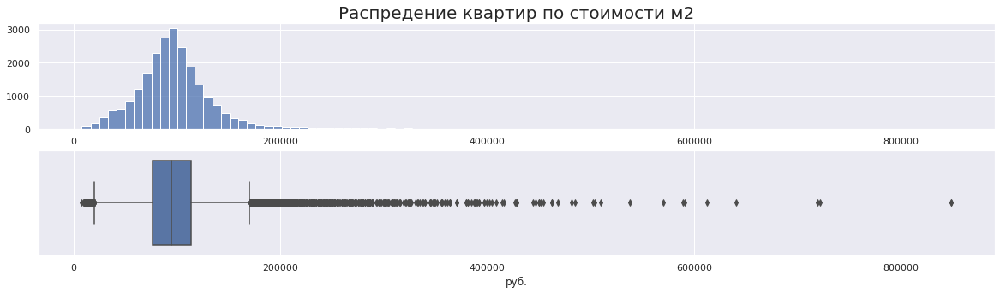

In [151]:
hist_boxplot(data['square_meter_cost'], 100, 'Распредение квартир по стоимости м2', 'руб.', '')

День недели публикации объявления (0 — понедельник, 1 — вторник и так далее):

In [152]:
data['day_exposition'] = data['first_day_exposition'].dt.weekday
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name,square_meter_cost,day_exposition
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.000000,8,False,...,18863,16028,1,482,2,755,114,Санкт-Петербург,120370.370370,3
1,7,3350000,40.4,2018-12-04,1,2.65,11,18.600000,1,False,...,12817,18603,0,<NA>,0,<NA>,81,Шушары,82920.792079,1
2,10,5196000,56.0,2015-08-20,2,2.65,5,34.300000,4,False,...,21741,13933,1,90,2,574,558,Санкт-Петербург,92785.714286,3
3,0,64900000,159.0,2015-07-24,3,2.65,14,100.458741,9,False,...,28098,6800,2,84,3,234,424,Санкт-Петербург,408176.100629,4
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.000000,13,False,...,31856,8098,2,112,1,48,121,Санкт-Петербург,100000.000000,1


месяц публикации объявления;

In [153]:
data['month_exposition'] = data['first_day_exposition'].dt.month
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name,square_meter_cost,day_exposition,month_exposition
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.000000,8,False,...,16028,1,482,2,755,114,Санкт-Петербург,120370.370370,3,3
1,7,3350000,40.4,2018-12-04,1,2.65,11,18.600000,1,False,...,18603,0,<NA>,0,<NA>,81,Шушары,82920.792079,1,12
2,10,5196000,56.0,2015-08-20,2,2.65,5,34.300000,4,False,...,13933,1,90,2,574,558,Санкт-Петербург,92785.714286,3,8
3,0,64900000,159.0,2015-07-24,3,2.65,14,100.458741,9,False,...,6800,2,84,3,234,424,Санкт-Петербург,408176.100629,4,7
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.000000,13,False,...,8098,2,112,1,48,121,Санкт-Петербург,100000.000000,1,6


Год публикации объявления:

In [154]:
data['year_exposition'] = data['first_day_exposition'].dt.year
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name,square_meter_cost,day_exposition,month_exposition,year_exposition
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.000000,8,False,...,1,482,2,755,114,Санкт-Петербург,120370.370370,3,3,2019
1,7,3350000,40.4,2018-12-04,1,2.65,11,18.600000,1,False,...,0,<NA>,0,<NA>,81,Шушары,82920.792079,1,12,2018
2,10,5196000,56.0,2015-08-20,2,2.65,5,34.300000,4,False,...,1,90,2,574,558,Санкт-Петербург,92785.714286,3,8,2015
3,0,64900000,159.0,2015-07-24,3,2.65,14,100.458741,9,False,...,2,84,3,234,424,Санкт-Петербург,408176.100629,4,7,2015
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.000000,13,False,...,2,112,1,48,121,Санкт-Петербург,100000.000000,1,6,2018


Тип этажа квартиры (значения — «‎первый», «последний», «другой»):

In [155]:
def floor_type(row):
    if row['floor'] == 1:
        return 'первый'
    if row['floor'] == row['floors_total']:
        return 'последний'
    return 'другой'

data['floor_type'] = data.apply(floor_type, axis=1)
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name,square_meter_cost,day_exposition,month_exposition,year_exposition,floor_type
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.000000,8,False,...,482,2,755,114,Санкт-Петербург,120370.370370,3,3,2019,другой
1,7,3350000,40.4,2018-12-04,1,2.65,11,18.600000,1,False,...,<NA>,0,<NA>,81,Шушары,82920.792079,1,12,2018,первый
2,10,5196000,56.0,2015-08-20,2,2.65,5,34.300000,4,False,...,90,2,574,558,Санкт-Петербург,92785.714286,3,8,2015,другой
3,0,64900000,159.0,2015-07-24,3,2.65,14,100.458741,9,False,...,84,3,234,424,Санкт-Петербург,408176.100629,4,7,2015,другой
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.000000,13,False,...,112,1,48,121,Санкт-Петербург,100000.000000,1,6,2018,другой


Расстояние до центра города в километрах (переведите из м в км и округлите до целых значений):

In [156]:
data['cityCenters_km'] = data['cityCenters_nearest']//1000
data.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_around3000,ponds_nearest,days_exposition,correct_locality_name,square_meter_cost,day_exposition,month_exposition,year_exposition,floor_type,cityCenters_km
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.000000,8,False,...,2,755,114,Санкт-Петербург,120370.370370,3,3,2019,другой,16
1,7,3350000,40.4,2018-12-04,1,2.65,11,18.600000,1,False,...,0,<NA>,81,Шушары,82920.792079,1,12,2018,первый,18
2,10,5196000,56.0,2015-08-20,2,2.65,5,34.300000,4,False,...,2,574,558,Санкт-Петербург,92785.714286,3,8,2015,другой,13
3,0,64900000,159.0,2015-07-24,3,2.65,14,100.458741,9,False,...,3,234,424,Санкт-Петербург,408176.100629,4,7,2015,другой,6
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.000000,13,False,...,1,48,121,Санкт-Петербург,100000.000000,1,6,2018,другой,8


In [157]:
data['cityCenters_km'].describe()

count    17698.000000
mean        13.750989
std          8.620861
min          0.000000
25%          9.000000
50%         13.000000
75%         16.000000
max         65.000000
Name: cityCenters_km, dtype: float64

In [158]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22964 entries, 0 to 23631
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   total_images           22964 non-null  int64         
 1   last_price             22964 non-null  int64         
 2   total_area             22964 non-null  float64       
 3   first_day_exposition   22964 non-null  datetime64[ns]
 4   rooms                  22964 non-null  int64         
 5   ceiling_height         22964 non-null  float64       
 6   floors_total           22964 non-null  int64         
 7   living_area            22964 non-null  float64       
 8   floor                  22964 non-null  int64         
 9   is_apartment           22964 non-null  bool          
 10  studio                 22964 non-null  bool          
 11  open_plan              22964 non-null  bool          
 12  kitchen_area           22964 non-null  float64       
 13  b

Новые фичи были добавлены, если цена квадратного метра не вызывает сомнения, то дни недели очень.

### Проведите исследовательский анализ данных

#### Общая площадь

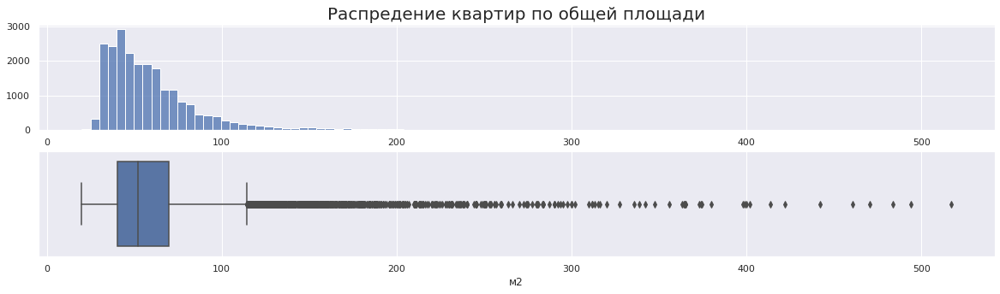

In [159]:
hist_boxplot(data['total_area'], 100, 'Распредение квартир по общей площади', 'м2', '')

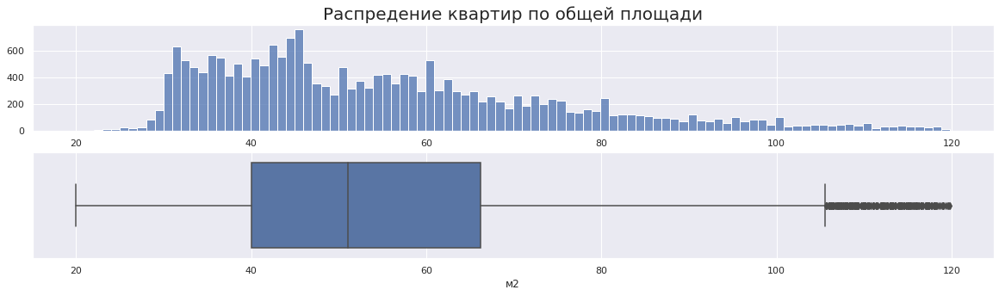

In [160]:
hist_boxplot(data[data['total_area']<120]['total_area'], 100, 'Распредение квартир по общей площади', 'м2', '')

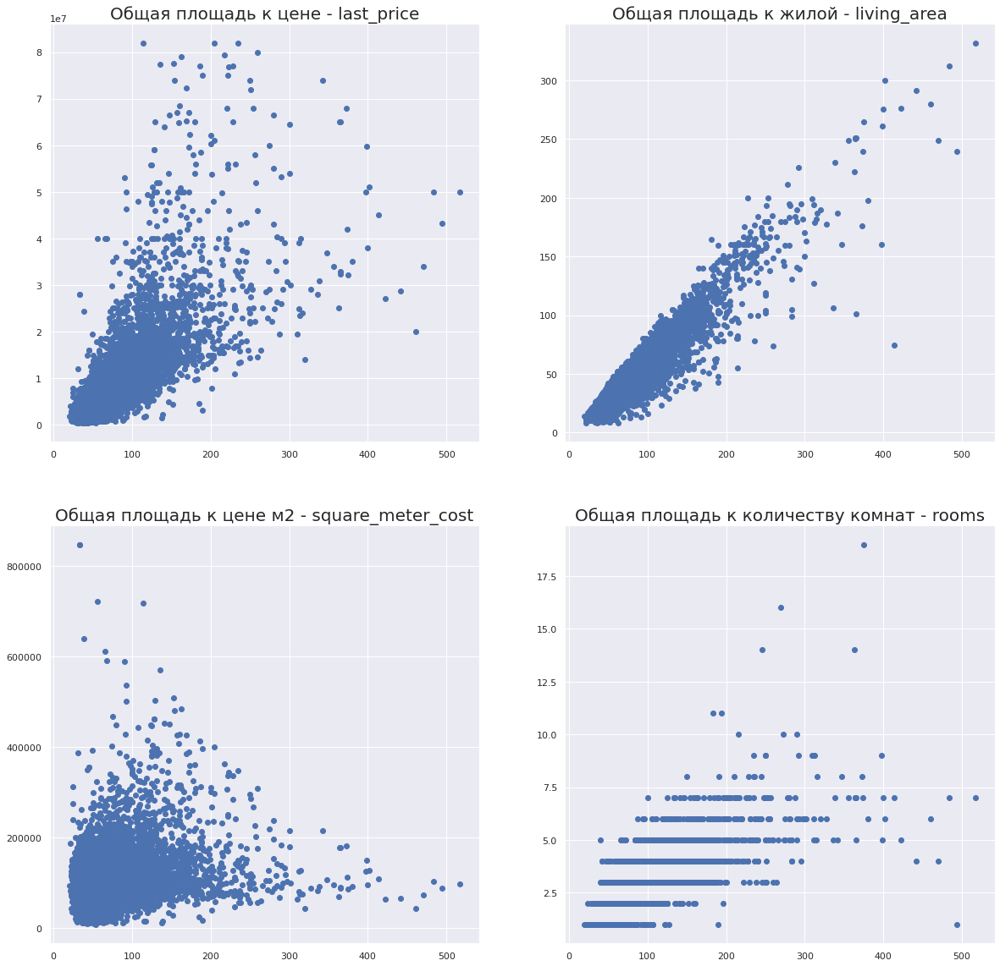

In [161]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.title('Общая площадь к цене - last_price', fontsize=20)
plt.scatter(data['total_area'], data['last_price'])
plt.subplot(2,2,2)
plt.title('Общая площадь к жилой - living_area', fontsize=20)
plt.scatter(data['total_area'], data['living_area'])
plt.subplot(2,2,3)
plt.title('Общая площадь к цене м2 - square_meter_cost', fontsize=20)
plt.scatter(data['total_area'], data['square_meter_cost'])
plt.subplot(2,2,4)
plt.title('Общая площадь к количеству комнат - rooms', fontsize=20)
plt.scatter(data['total_area'], data['rooms'])

`plot_correlation(data[['total_area', 'last_price', 'rooms', 'ceiling_height', 'floors_total', 'floor', 'living_area', 'is_apartment', 'studio', 'kitchen_area', 'balcony', 'parks_around3000', 'ponds_around3000', 'days_exposition','floor_type', ]])`

<img typeof="foaf:Image" src="https://i.postimg.cc/L5CvXrbS/image.jpg" alt="">

Мы видим как общая площадь квартиры находится в положительной корреляции по Пирсону с ценой, количество комнат, и жилой площадью.

#### жилая площадь

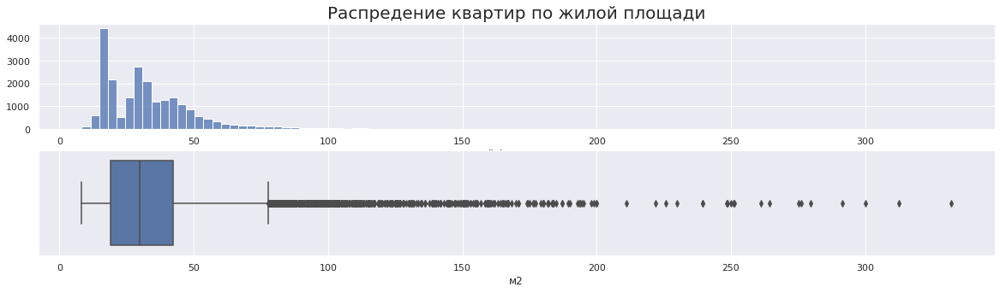

In [162]:
hist_boxplot(data['living_area'], 100, 'Распредение квартир по жилой площади', 'м2', '')

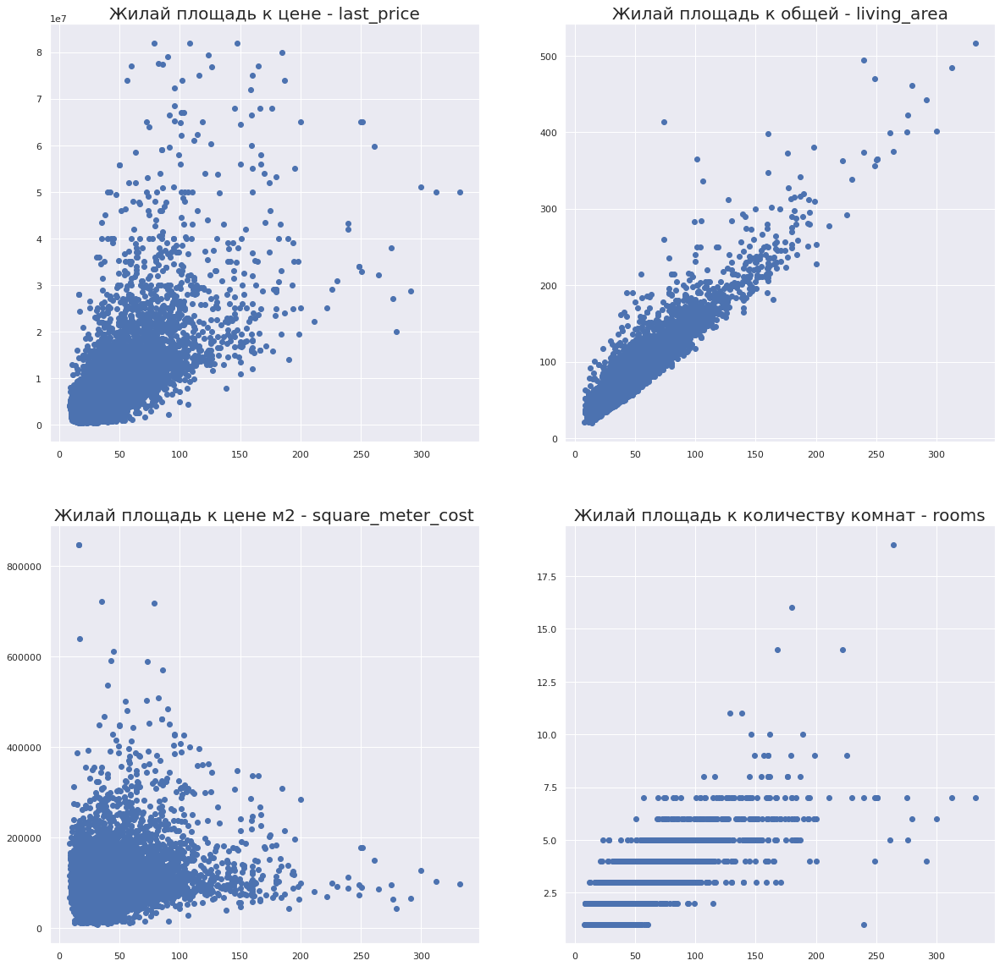

In [163]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.title('Жилай площадь к цене - last_price', fontsize=20)
plt.scatter(data['living_area'], data['last_price'])
plt.subplot(2,2,2)
plt.title('Жилай площадь к общей - living_area', fontsize=20)
plt.scatter(data['living_area'], data['total_area'])
plt.subplot(2,2,3)
plt.title('Жилай площадь к цене м2 - square_meter_cost', fontsize=20)
plt.scatter(data['living_area'], data['square_meter_cost'])
plt.subplot(2,2,4)
plt.title('Жилай площадь к количеству комнат - rooms', fontsize=20)
plt.scatter(data['living_area'], data['rooms'])

Жилая в прямой корреляции с общей, количеством комнат, ценой и немного высотой потолкой.

#### площадь кухни

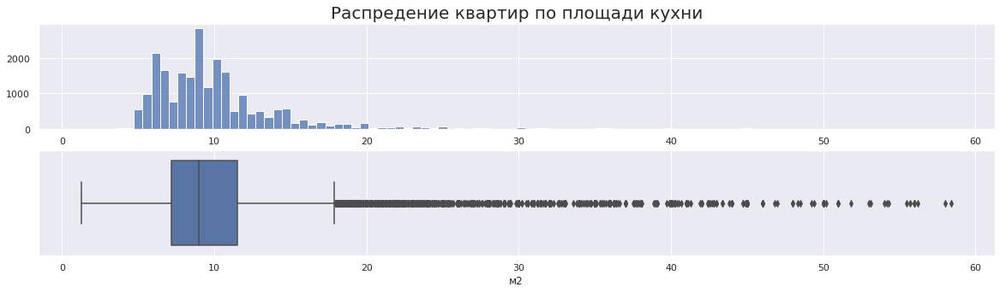

In [164]:
hist_boxplot(data['kitchen_area'], 100, 'Распредение квартир по площади кухни', 'м2', '')

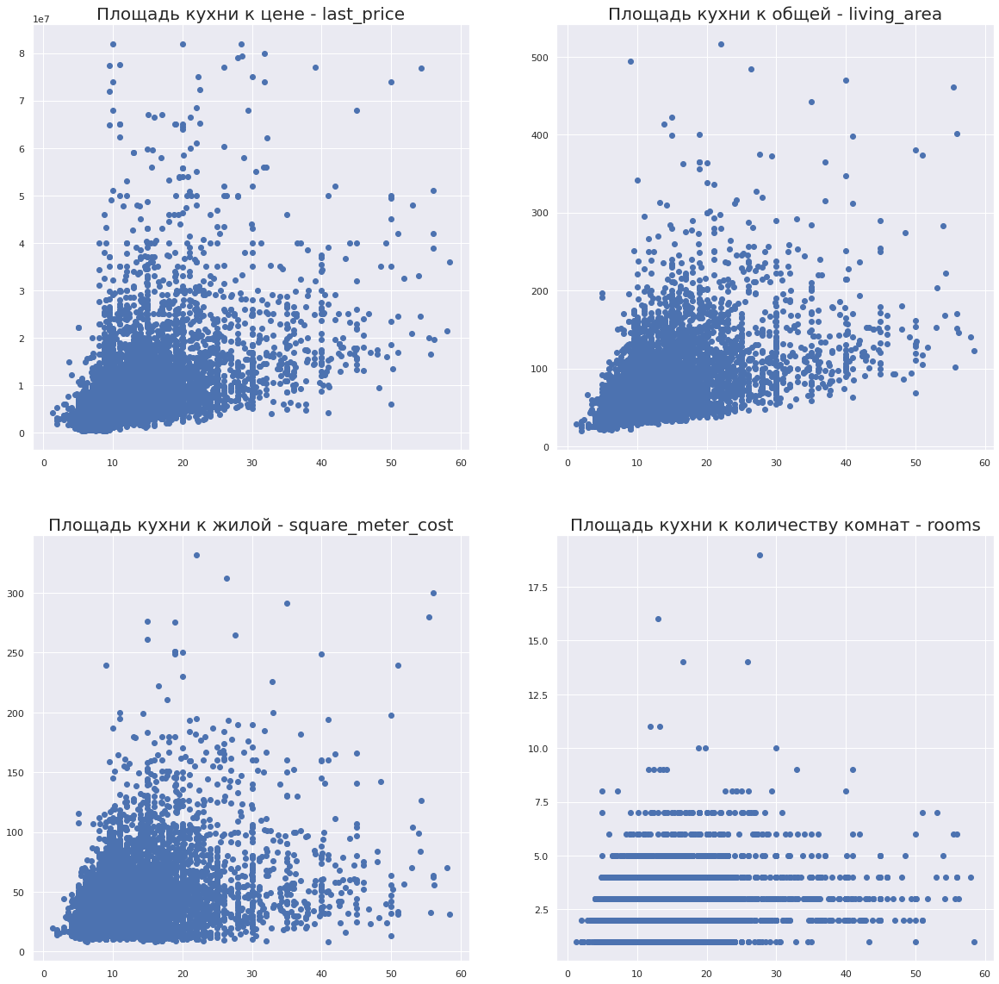

In [165]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.title('Площадь кухни к цене - last_price', fontsize=20)
plt.scatter(data['kitchen_area'], data['last_price'])
plt.subplot(2,2,2)
plt.title('Площадь кухни к общей - living_area', fontsize=20)
plt.scatter(data['kitchen_area'], data['total_area'])
plt.subplot(2,2,3)
plt.title('Площадь кухни к жилой - square_meter_cost', fontsize=20)
plt.scatter(data['kitchen_area'], data['living_area'])
plt.subplot(2,2,4)
plt.title('Площадь кухни к количеству комнат - rooms', fontsize=20)
plt.scatter(data['kitchen_area'], data['rooms'])

Площадь кухни коррелирует с общей, жилой и ценой.

#### цена объекта

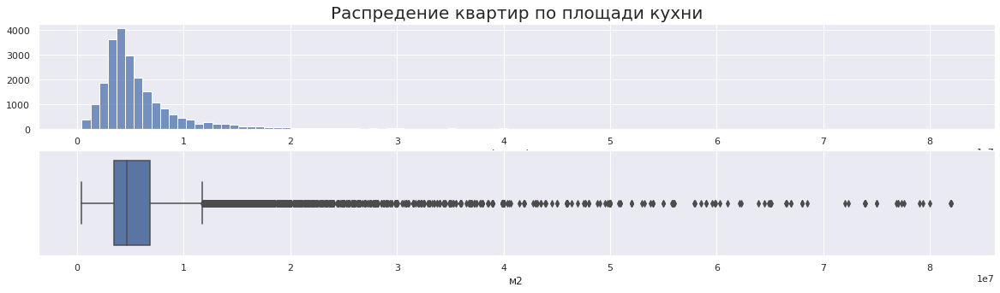

In [166]:
hist_boxplot(data['last_price'], 100, 'Распредение квартир по площади кухни', 'м2', '')

Цена коррелирует с площадями квартиры и количеством комнат.

#### количество комнат

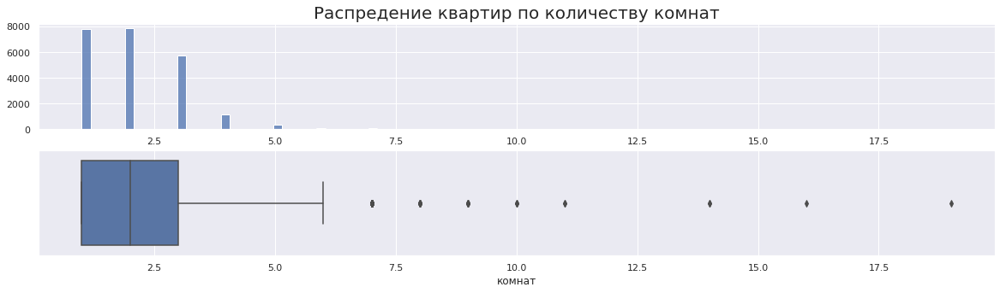

In [167]:
hist_boxplot(data['rooms'], 100, 'Распредение квартир по количеству комнат', 'комнат', '')

Количество комнат коррелирует с жилой площадью, чуть похуже общей и ценой.

#### высота потолков

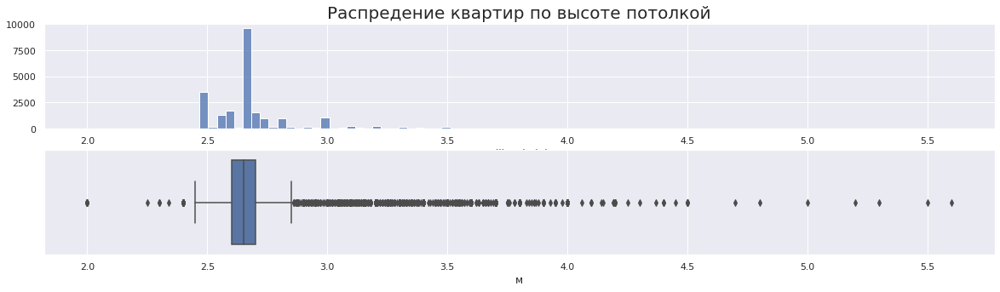

In [168]:
hist_boxplot(data['ceiling_height'], 100, 'Распредение квартир по высоте потолкой', 'м', '')

#### этаж квартиры

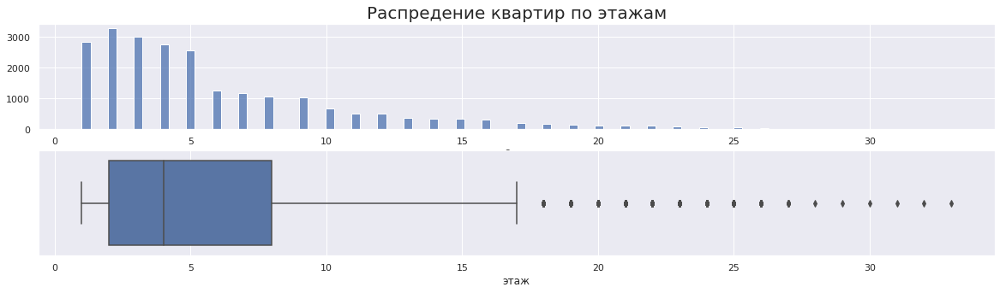

In [169]:
hist_boxplot(data['floor'], 100, 'Распредение квартир по этажам', 'этаж', '')

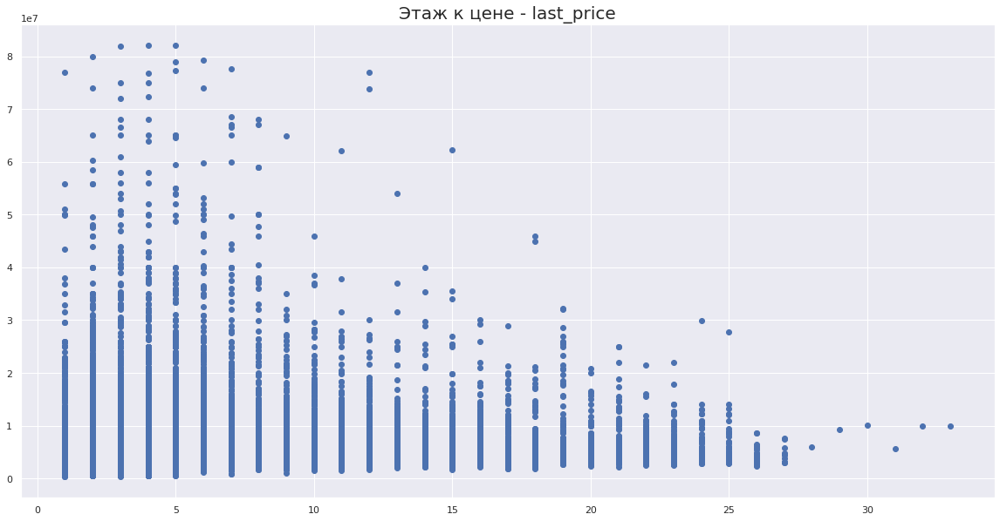

In [170]:
plt.figure(figsize=(20,10))
plt.title('Этаж к цене - last_price', fontsize=20)
plt.scatter(data['floor'], data['last_price'])

<AxesSubplot:xlabel='floor', ylabel='last_price'>

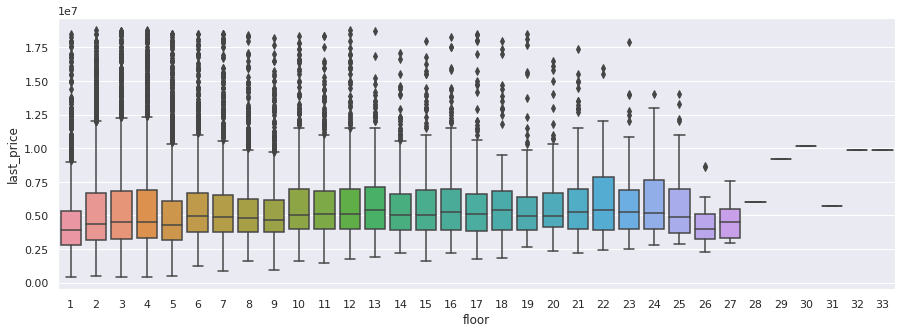

In [171]:
threshold = data['last_price'].quantile(0.95) + 2*data['last_price'].quantile(0.05)
fig, ax = plt.subplots(figsize =(15,5))
sns.boxplot(x = 'floor', 
            y = 'last_price',
            data = data.query('last_price <= @threshold'),ax=ax)  

Мы видим, что в целом квартиры на 1 и 5 этажах продаются дешевле рынка. Проверим нашу гипотезу.

#### тип этажа квартиры («первый», «последний», «другой»):

<AxesSubplot:xlabel='floor_type', ylabel='Count'>

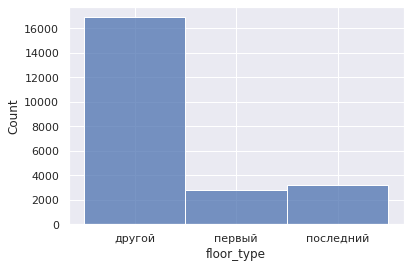

In [172]:
sns.histplot(data['floor_type'])

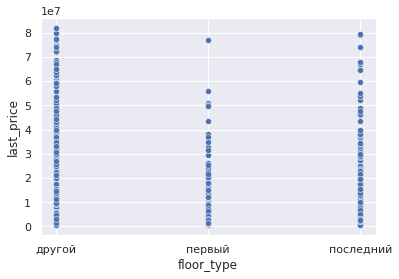

In [173]:
sns.scatterplot(x=data['floor_type'], y=data['last_price']);

#### общее количество этажей в доме

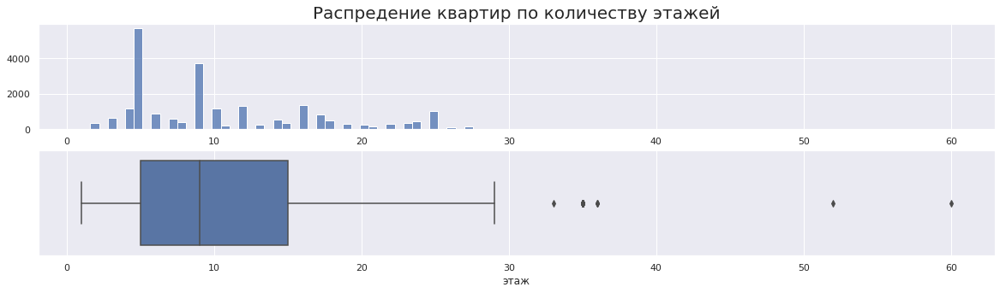

In [174]:
hist_boxplot(data['floors_total'], 100, 'Распредение квартир по количеству этажей', 'этаж', '')

Преобладают 5- и 9-этажные домаа.

#### расстояние до центра города в метрах

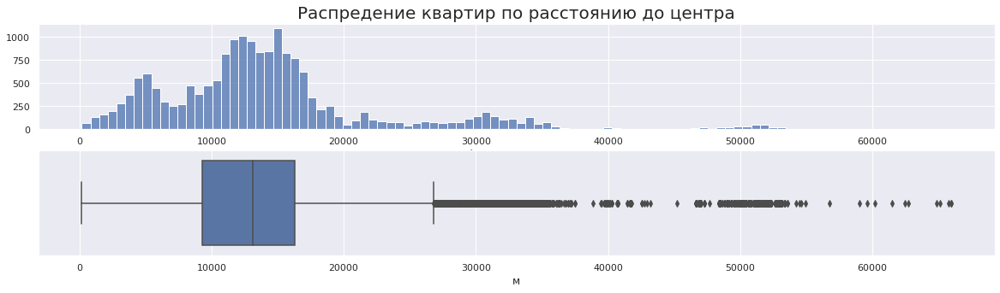

In [175]:
hist_boxplot(data['cityCenters_nearest'], 100, 'Распредение квартир по расстоянию до центра', 'м', '')

Мало квартир в центре, в основном все на окраинах, или за пределами Питера.

#### расстояние до ближайшего аэропорта

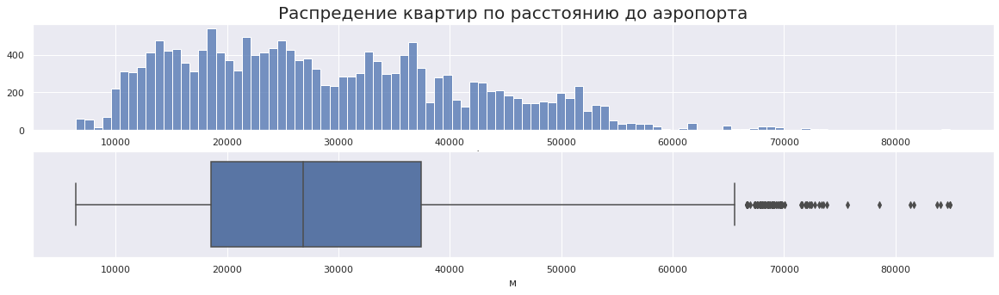

In [176]:
hist_boxplot(data['airports_nearest'], 100, 'Распредение квартир по расстоянию до аэропорта', 'м', '')

Мало квартир рядом с аэропортом, что логично.

#### расстояние до ближайшего парка

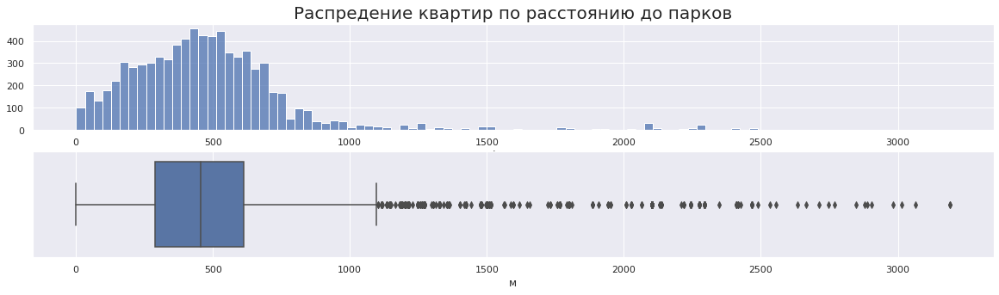

In [177]:
hist_boxplot(data['parks_nearest'], 100, 'Распредение квартир по расстоянию до парков', 'м', '')

Если не брать в расчет, что большая часть квартир не имеет в радиусе 3 км парки, то в остальном в средем от 350 до 600 метров до парков.

#### день и месяц публикации объявления
(ну это уже гороскопами и консирологией попахивает)

<AxesSubplot:xlabel='day_exposition', ylabel='Count'>

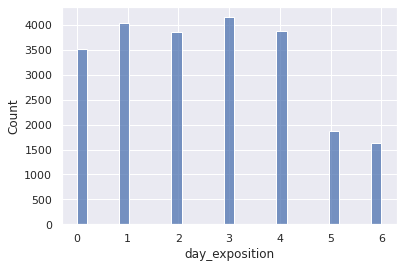

In [178]:
sns.histplot(data['day_exposition'])

<AxesSubplot:xlabel='month_exposition', ylabel='Count'>

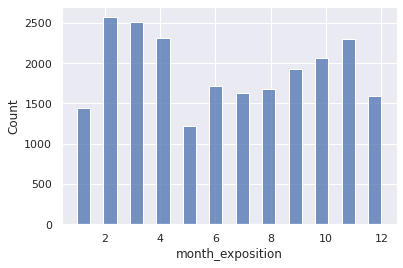

In [179]:
sns.histplot(data['month_exposition'])

Мы получили очевидные данные, активность по дням в будни, в разрезе месяцев спад в декабре, январе, мае и в летние месяцы, что объясняется большим количеством праздничных дней в 1 и 5 месяцы, подготовкой к Новому году в декабре и снижением деловой активности летом.

Чтобы хоть как-то разнообразить графики...

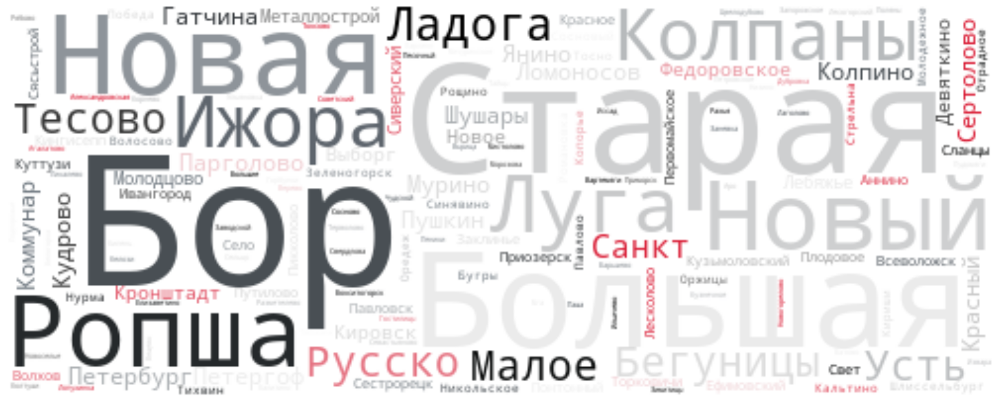

In [180]:
import matplotlib.colors as clrs
from wordcloud import WordCloud

cmap = clrs.LinearSegmentedColormap.from_list("", ['#d6001c', '#f5f5f5', '#d7d7d7', '#6a737b', '#000000', '#ffffff'])

text = str(place_names).replace(',', '').replace('[', '').replace("'", '').replace(']', '').replace('.', '').replace('\\n', '')

wordcloud = WordCloud(background_color = 'white', width = 500,  height = 200,colormap=cmap, max_words = 150).generate(text)

plt.figure( figsize=(20,10))
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### Изучите, как быстро продавались квартиры (столбец days_exposition). Этот параметр показывает, сколько дней «висело» каждое объявление.

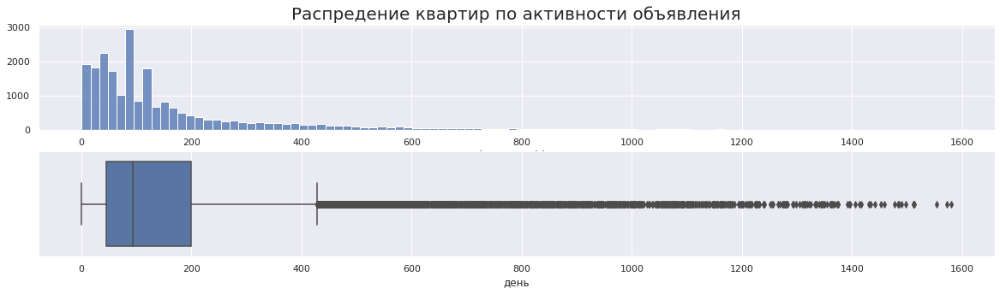

In [181]:
hist_boxplot(data['days_exposition'], 100, 'Распредение квартир по активности объявления', 'день', '')

In [182]:
data['days_exposition'].describe()

count    22964.000000
mean       171.271251
std        207.061179
min          1.000000
25%         46.000000
50%         93.000000
75%        199.000000
max       1580.000000
Name: days_exposition, dtype: float64

Быстрыми можно считать прожажи, которые были осуществлены менее чем за 46 дней, а долгими - более 199 дней.

#### Какие факторы больше всего влияют на общую (полную) стоимость объекта?

<AxesSubplot:title={'center':'Год к цене - year_exposition'}, xlabel='year_exposition', ylabel='last_price'>

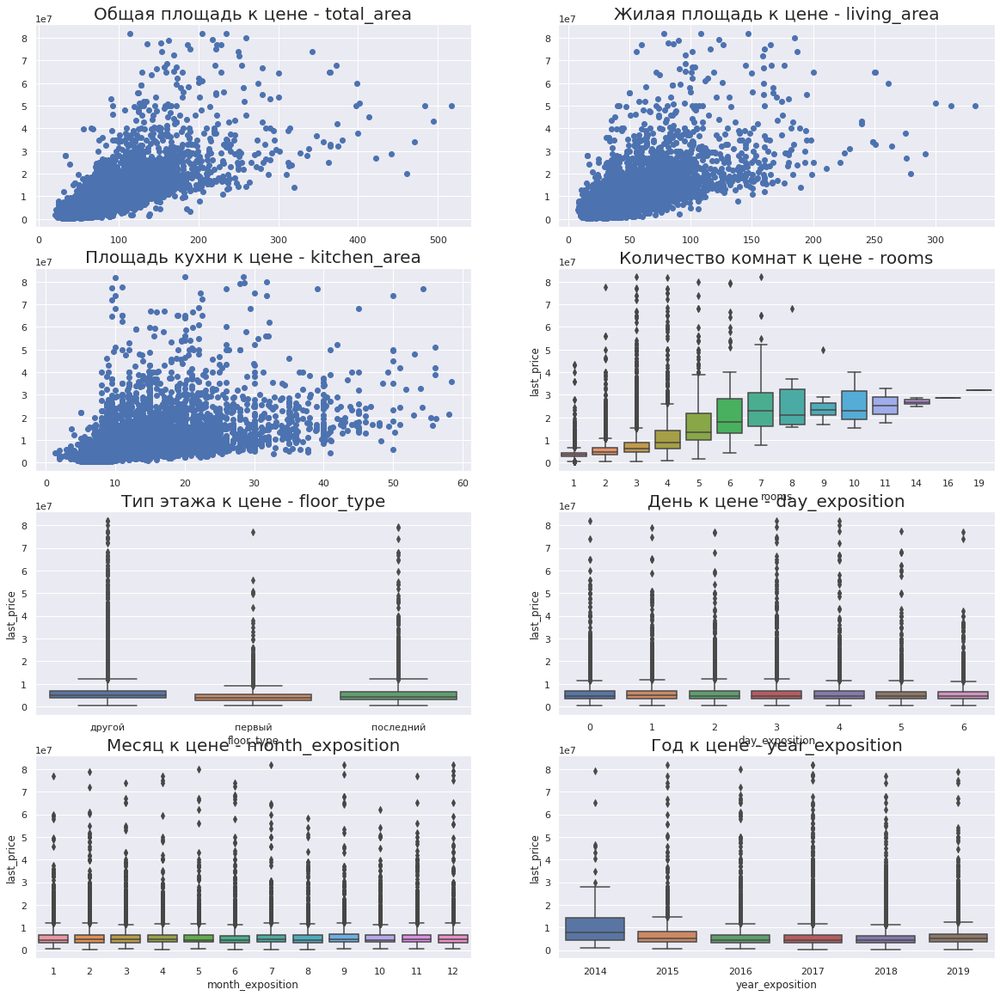

In [183]:
plt.figure(figsize=(20,20))
plt.subplot(4,2,1)
plt.title('Общая площадь к цене - total_area', fontsize=20)
plt.scatter(data['total_area'], data['last_price'])
plt.subplot(4,2,2)
plt.title('Жилая площадь к цене - living_area', fontsize=20)
plt.scatter(data['living_area'], data['last_price'])
plt.subplot(4,2,3)
plt.title('Площадь кухни к цене - kitchen_area', fontsize=20)
plt.scatter(data['kitchen_area'], data['last_price'])
plt.subplot(4,2,4)
plt.title('Количество комнат к цене - rooms', fontsize=20)
sns.boxplot(x='rooms', y='last_price', data=data)

plt.subplot(4,2,5)
plt.title('Тип этажа к цене - floor_type', fontsize=20)
sns.boxplot(x='floor_type', y='last_price', data=data)
plt.subplot(4,2,6)
plt.title('День к цене - day_exposition', fontsize=20)
sns.boxplot(x='day_exposition', y='last_price', data=data)
plt.subplot(4,2,7)
plt.title('Месяц к цене - month_exposition', fontsize=20)
sns.boxplot(x='month_exposition', y='last_price', data=data)
plt.subplot(4,2,8)
plt.title('Год к цене - year_exposition', fontsize=20)
sns.boxplot(x='year_exposition', y='last_price', data=data)

* общая и жилая площади влияют на цену квартир;
* площадь кухонь меньше;
* количество комнат влияет на цену до 5-6 комнат, далее рост цены не оказывает такого сильного влияния;
* первые этажи продаются дешевле, последние тоже чуть дороже;
* в восресенье реже подают объявления с дорогими квартирами;
* в августе и октябре реже выставляют дорогие квартиры;
* после 2014 г. заметен спад по ценам.

#### Посчитайте среднюю цену одного квадратного метра в 10 населённых пунктах с наибольшим числом объявлений

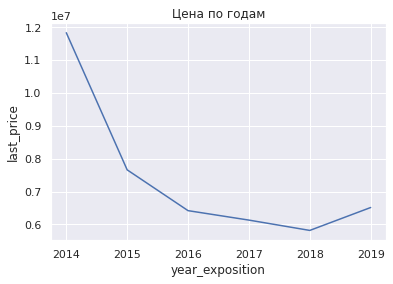

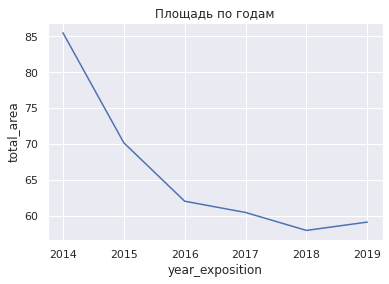

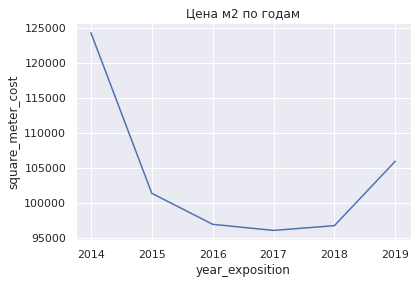

In [233]:
peter_cost = data.pivot_table(index='year_exposition')['last_price']
peter_area = data.pivot_table(index='year_exposition')['total_area']
peter_smc = data.pivot_table(index='year_exposition')['square_meter_cost']
plt.title('Цена по годам')
sns.lineplot(data=peter_cost)
plt.show()
plt.title('Площадь по годам')
sns.lineplot(data=peter_area)
plt.show()
plt.title('Цена м2 по годам')
sns.lineplot(data=peter_smc)
plt.show()


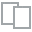
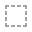
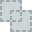
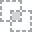
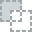
...
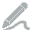
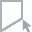
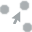
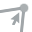
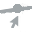

In [207]:
plot_correlation(data[['square_meter_cost', 'last_price', 'total_area']])

In [184]:
top_10 = data['correct_locality_name'].value_counts().head(10)
top_10

Санкт-Петербург    15313
Мурино               522
Шушары               431
Кудрово              425
Всеволожск           381
Пушкин               363
Колпино              336
Парголово            320
Гатчина              302
Выборг               229
Name: correct_locality_name, dtype: int64

In [205]:
data_top_10 = data.query('correct_locality_name in @top_10.index')
data_top_10.pivot_table(
    index='correct_locality_name',
    values='square_meter_cost'
    ).sort_values(by='square_meter_cost', ascending=False)

,square_meter_cost
correct_locality_name,
Санкт-Петербург,112822.125292
Пушкин,102955.524939
Кудрово,94656.014169
Парголово,90056.264519
Мурино,85029.507568
Шушары,78203.556207
Колпино,75387.280677
Гатчина,68632.546213
Всеволожск,68531.681316


In [206]:
data.groupby('correct_locality_name').agg({'balcony':'count', 'total_area':'median', 'square_meter_cost':'mean'}) \
    .sort_values(by = 'balcony', ascending = False) \
    .head(10)

,balcony,total_area,square_meter_cost
correct_locality_name,,,
Санкт-Петербург,15313,55.0,112822.125292
Мурино,522,39.4,85029.507568
Шушары,431,50.7,78203.556207
Кудрово,425,42.0,94656.014169
Всеволожск,381,54.0,68531.681316
Пушкин,363,53.1,102955.524939
Колпино,336,50.0,75387.280677
Парголово,320,43.0,90056.264519
Гатчина,302,45.1,68632.546213


Получили стоимость квадратного метра по 10 наиболее часто встречаючимся в датасете локациям.

#### Вычислите среднюю цену каждого километра. Опишите, как стоимость объектов зависит от расстояния до центра города

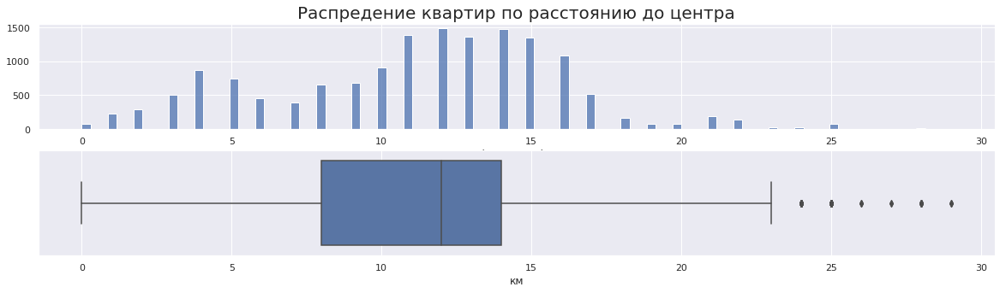

In [187]:
hist_boxplot(data[data['correct_locality_name'] == 'Санкт-Петербург']['cityCenters_km'], 100, 'Распредение квартир по расстоянию до центра', 'км', '')

In [188]:
peter_km_cost = data[data['correct_locality_name'] == 'Санкт-Петербург'].pivot_table(index='cityCenters_km')['last_price']
peter_km_cost

cityCenters_km
0     1.805980e+07
1     1.396650e+07
2     1.337060e+07
3     1.110384e+07
4     1.244990e+07
5     1.272692e+07
6     1.303259e+07
7     1.094738e+07
8     8.478339e+06
9     6.462706e+06
10    6.390960e+06
11    6.017829e+06
12    6.006443e+06
13    6.056597e+06
14    5.798694e+06
15    5.529575e+06
16    5.553439e+06
17    4.910965e+06
18    5.403703e+06
19    4.784076e+06
20    6.515902e+06
21    5.205768e+06
22    5.466762e+06
23    4.167517e+06
24    3.862235e+06
25    4.058712e+06
26    3.575000e+06
27    8.300000e+06
28    4.910500e+06
29    3.833333e+06
Name: last_price, dtype: float64

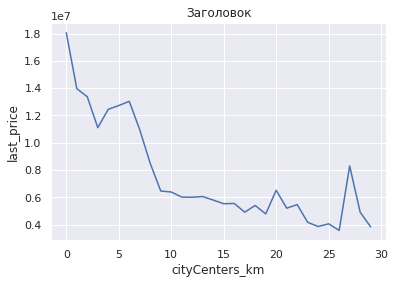

In [189]:
sns.lineplot(data=peter_km_cost)
plt.title('Заголовок')
plt.show()

Как и ожидалось, чем дальше квартира от центра города, тем она дешевле, но есть два исключения, на 5 и 27 км, также есть небольшой подъем цены на 20 км. Это могут престижные районы, модные жилые комплексы или скопление жилья бизнес-уровня.

Были проанализированы имеющиеся данные, чего-то экстраординарного по сравнению с этапом подготовки не выявлено. Данные подтверждают устоявшиеся понятия о недвижимости - очевидные зависимости.

### Общий вывод

Стоимость квартир в районе Санкт-Петербурга зависит от множеста факторов. Наибольшее влияние на цену оказывают:
* общай, жилая площади квартиры;
* количество комнат в квартире;
* удаленность от центра;
* этаж;

В среднем квартиры продают три месяца, повезло, если квартира ушла быстрее, чем за полтора месяца. Если неликвид, то от полугода.

Самая большая корреляция между ценой и общей площадью квартиры.

Отрицательно влияют на цены первый и последний этажи в доме.

В центре самые дорогие квартиры, если не брать в расчет квартиры с гиганской площадью и 5 балконами.

Было потрачено много времени на то, чтобы доказать, что день недели не влияет на стоимость квартиры.

Цены на недвижимость подвержены сезоным изменениям. Не рекомендуется для продажи выбирать декабрь-январь, май и летние месяцы.

Ориентироваться на годовые циклы бессмесленно. По историческим данным мы можем сделать сравнение и отметить, какой из годов был удачный, но на текущий момент предсказывать, хороший сейчас год или нет нельзя. Все задачи рекурсий разбиваются о внешний информационный и политический фон.

**Чек-лист готовности проекта**

Поставьте 'x' в выполненных пунктах. Далее нажмите Shift+Enter.

- [x]  открыт файл
- [x]  файлы изучены (выведены первые строки, метод `info()`, гистограммы и т.д.)
- [x]  определены пропущенные значения
- [x]  заполнены пропущенные значения там, где это возможно
- [x]  есть пояснение, какие пропущенные значения обнаружены
- [x]  изменены типы данных
- [x]  есть пояснение, в каких столбцах изменены типы и почему
- [x]  устранены неявные дубликаты в названиях населённых пунктов
- [x]  устранены редкие и выбивающиеся значения (аномалии) во всех столбцах
- [x]  посчитано и добавлено в таблицу: цена одного квадратного метра
- [x]  посчитано и добавлено в таблицу: день публикации объявления (0 - понедельник, 1 - вторник и т.д.)
- [x]  посчитано и добавлено в таблицу: месяц публикации объявления
- [x]  посчитано и добавлено в таблицу: год публикации объявления
- [x]  посчитано и добавлено в таблицу: тип этажа квартиры (значения — «первый», «последний», «другой»)
- [x]  посчитано и добавлено в таблицу: расстояние в км до центра города
- [x]  изучены и описаны следующие параметры:
        - общая площадь;
        - жилая площадь;
        - площадь кухни;
        - цена объекта;
        - количество комнат;
        - высота потолков;
        - этаж квартиры;
        - тип этажа квартиры («первый», «последний», «другой»);
        - общее количество этажей в доме;
        - расстояние до центра города в метрах;
        - расстояние до ближайшего аэропорта;
        - расстояние до ближайшего парка;
        - день и месяц публикации объявления
- [x]  построены гистограммы для каждого параметра
- [x]  выполнено задание: "Изучите, как быстро продавались квартиры (столбец days_exposition). Этот параметр показывает, сколько дней «висело» каждое объявление.
    - Постройте гистограмму.
    - Посчитайте среднее и медиану.
    - В ячейке типа markdown опишите, сколько обычно занимает продажа. Какие продажи можно считать быстрыми, а какие — необычно долгими?"
- [x]  выполнено задание: "Какие факторы больше всего влияют на общую (полную) стоимость объекта? Постройте графики, которые покажут зависимость цены от указанных ниже параметров. Для подготовки данных перед визуализацией вы можете использовать сводные таблицы."
        - общей площади;
        - жилой площади;
        - площади кухни;
        - количество комнат;
        - типа этажа, на котором расположена квартира (первый, последний, другой);
        - даты размещения (день недели, месяц, год);
- [x]  выполнено задание: "Посчитайте среднюю цену одного квадратного метра в 10 населённых пунктах с наибольшим числом объявлений. Выделите населённые пункты с самой высокой и низкой стоимостью квадратного метра. Эти данные можно найти по имени в столбце `locality_name`."
- [x]  выполнено задание: "Ранее вы посчитали расстояние до центра в километрах. Теперь выделите квартиры в Санкт-Петербурге с помощью столбца `locality_name` и вычислите среднюю цену каждого километра. Опишите, как стоимость объектов зависит от расстояния до центра города."
- [x]  в каждом этапе есть промежуточные выводы
- [x]  есть общий вывод